In [1]:
print('')

aim to plot change in gradient as consider changing minimum magntiude of data

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from obspy import UTCDateTime
from obspy.clients.fdsn import Client
import pandas as pd

import scipy
from tabulate import tabulate

import matplotlib
matplotlib.rcParams.update({'font.size': 20})

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [4]:
from data_plotting_func_min_dist import *
# from spearman_plotting_func import *

change magnitude limits, colors in functions file

In [5]:
filenames = ['eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20',
            'eq_object_05s_bandpass_01_19_snr_20_blank_0_new_snr20',
            'eq_object_1s_bandpass_01_19_snr_20_blank_0_new_snr20',
            'eq_object_4s_bandpass_01_19_snr_20_blank_0_new_snr20']

'''filenames = ['eq_object_03s_bandpass_01_19_snr_20_blank_0_new',
              'eq_object_03s_bandpass_01_19_snr_20_blank_005_new',
              'eq_object_03s_bandpass_01_19_snr_20_blank_01_new']'''

'''filenames = ['eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr5',
             'eq_object_03s_bandpass_01_19_snr_20_blank_005_new_snr5', 
             'eq_object_03s_bandpass_01_19_snr_20_blank_01_new_snr5',
             'eq_object_05s_bandpass_01_19_snr_20_blank_0_new_snr5',
             'eq_object_05s_bandpass_01_19_snr_20_blank_005_new_snr5', 
             'eq_object_05s_bandpass_01_19_snr_20_blank_01_new_snr5',
             'eq_object_05s_bandpass_01_19_snr_20_blank_025_new_snr5',
             'eq_object_1s_bandpass_01_19_snr_20_blank_0_new_snr5', 
             'eq_object_1s_bandpass_01_19_snr_20_blank_005_new_snr5',
             'eq_object_1s_bandpass_01_19_snr_20_blank_01_new_snr5',
             'eq_object_1s_bandpass_01_19_snr_20_blank_025_new_snr5',
             'eq_object_1s_bandpass_01_19_snr_20_blank_05_new_snr5',
              'eq_object_4s_bandpass_01_19_snr_20_blank_0_new_snr5',
              'eq_object_4s_bandpass_01_19_snr_20_blank_005_new_snr5',
              'eq_object_4s_bandpass_01_19_snr_20_blank_01_new_snr5',
              'eq_object_4s_bandpass_01_19_snr_20_blank_025_new_snr5',
              'eq_object_4s_bandpass_01_19_snr_20_blank_05_new_snr5',
              'eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20',
             'eq_object_03s_bandpass_01_19_snr_20_blank_005_new_snr20', 
             'eq_object_03s_bandpass_01_19_snr_20_blank_01_new_snr20',
             'eq_object_05s_bandpass_01_19_snr_20_blank_0_new_snr20',
             'eq_object_05s_bandpass_01_19_snr_20_blank_005_new_snr20', 
             'eq_object_05s_bandpass_01_19_snr_20_blank_01_new_snr20',
             'eq_object_05s_bandpass_01_19_snr_20_blank_025_new_snr20',
             'eq_object_1s_bandpass_01_19_snr_20_blank_0_new_snr20', 
             'eq_object_1s_bandpass_01_19_snr_20_blank_005_new_snr20',
             'eq_object_1s_bandpass_01_19_snr_20_blank_01_new_snr20',
             'eq_object_1s_bandpass_01_19_snr_20_blank_025_new_snr20',
             'eq_object_1s_bandpass_01_19_snr_20_blank_05_new_snr20',
              'eq_object_4s_bandpass_01_19_snr_20_blank_0_new_snr20',
              'eq_object_4s_bandpass_01_19_snr_20_blank_005_new_snr20',
              'eq_object_4s_bandpass_01_19_snr_20_blank_01_new_snr20',
              'eq_object_4s_bandpass_01_19_snr_20_blank_025_new_snr20',
              'eq_object_4s_bandpass_01_19_snr_20_blank_05_new_snr20']'''

"filenames = ['eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr5',\n             'eq_object_03s_bandpass_01_19_snr_20_blank_005_new_snr5', \n             'eq_object_03s_bandpass_01_19_snr_20_blank_01_new_snr5',\n             'eq_object_05s_bandpass_01_19_snr_20_blank_0_new_snr5',\n             'eq_object_05s_bandpass_01_19_snr_20_blank_005_new_snr5', \n             'eq_object_05s_bandpass_01_19_snr_20_blank_01_new_snr5',\n             'eq_object_05s_bandpass_01_19_snr_20_blank_025_new_snr5',\n             'eq_object_1s_bandpass_01_19_snr_20_blank_0_new_snr5', \n             'eq_object_1s_bandpass_01_19_snr_20_blank_005_new_snr5',\n             'eq_object_1s_bandpass_01_19_snr_20_blank_01_new_snr5',\n             'eq_object_1s_bandpass_01_19_snr_20_blank_025_new_snr5',\n             'eq_object_1s_bandpass_01_19_snr_20_blank_05_new_snr5',\n              'eq_object_4s_bandpass_01_19_snr_20_blank_0_new_snr5',\n              'eq_object_4s_bandpass_01_19_snr_20_blank_005_new_snr5',\n     

## colored points and grey points

In [ ]:
%matplotlib inline
min_dist = 20
max_dist = 200

for f in filenames:
    print(f)
    df = pd.read_pickle(f'/home/earthquakes1/homes/Rebecca/phd/data/results_database/{f}')
    for n_stations in range(0, 6, 1):
        x_tp, y_tp = calc_tp_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_pgd, y_pgd = calc_pgd_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_tc, y_tc = calc_tc_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_iv2, y_iv2 = calc_iv2_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)

        plot_data_subplots([x_tp, x_pgd, x_tc, x_iv2], [y_tp, y_pgd, y_tc, y_iv2], ['tp','pgd','tc','iv2'],f,n=n_stations, min_dist = min_dist, max_dist = max_dist, save=True)
        plot_data_subplots_grey([x_tp, x_pgd, x_tc, x_iv2], [y_tp, y_pgd, y_tc, y_iv2], ['tp','pgd','tc','iv2'],f,n=n_stations, min_dist = min_dist, max_dist = max_dist, save=True)


## lines at m3+ and m>window length

eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


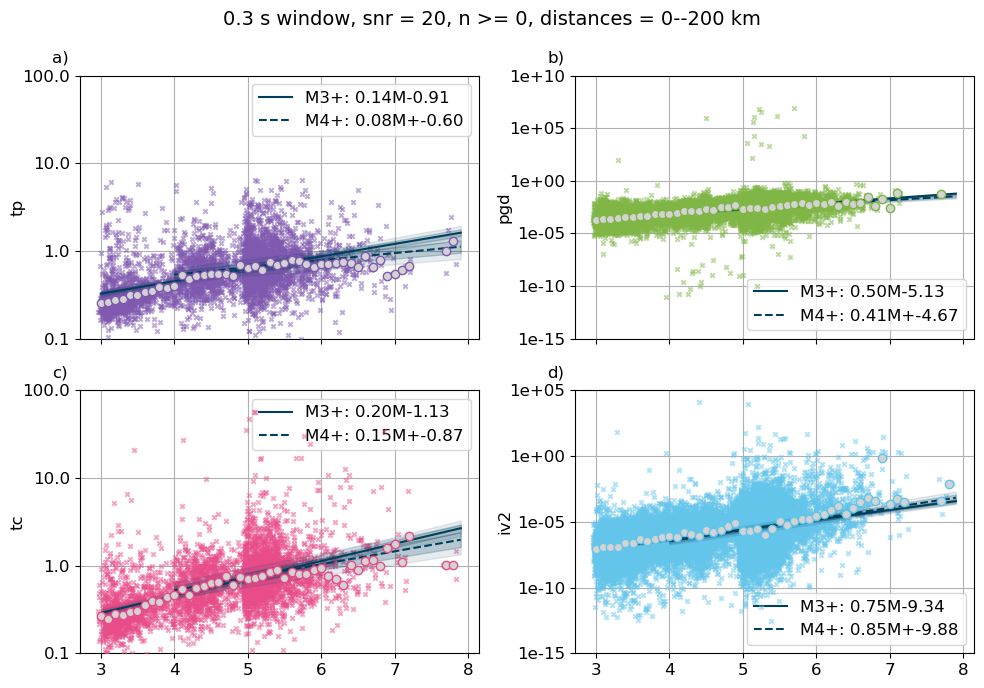

0.1420503338389152 0.0867684854186651
0.19746867896262488 0.15222713039681796


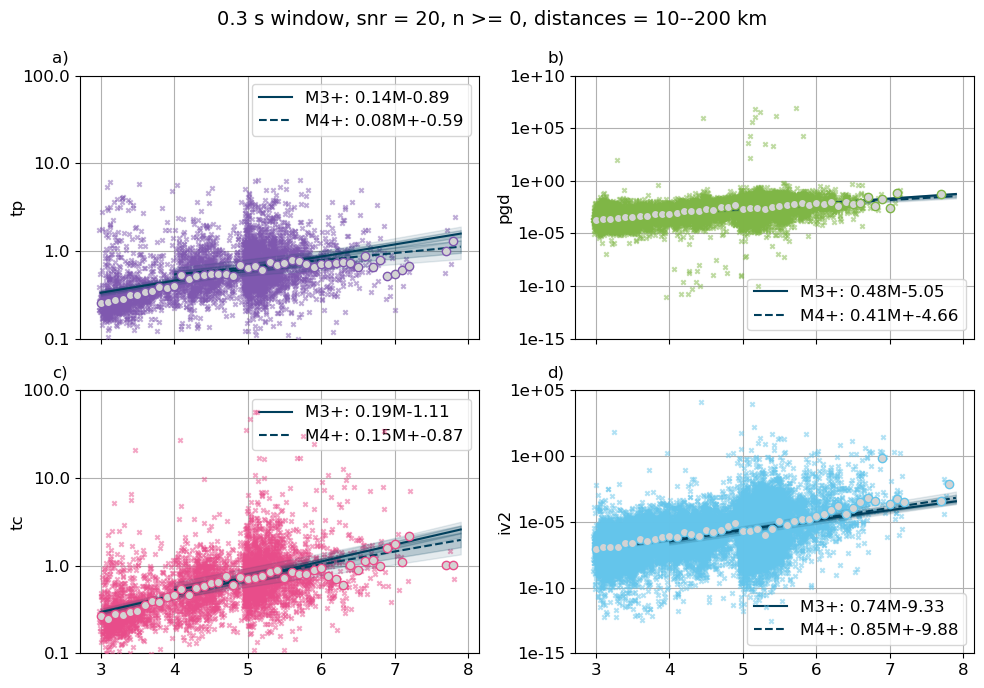

0.13783098684634518 0.0863730508957296
0.19246726078095466 0.15153716757224667


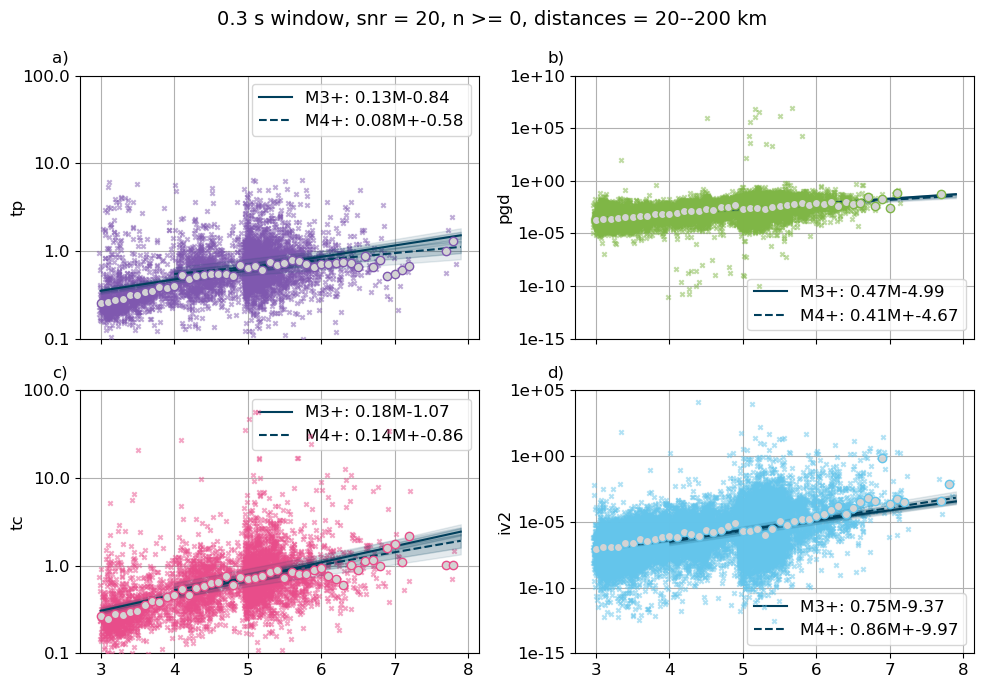

0.1292113382397619 0.0843076251192265
0.18430076528558959 0.14832473568010116


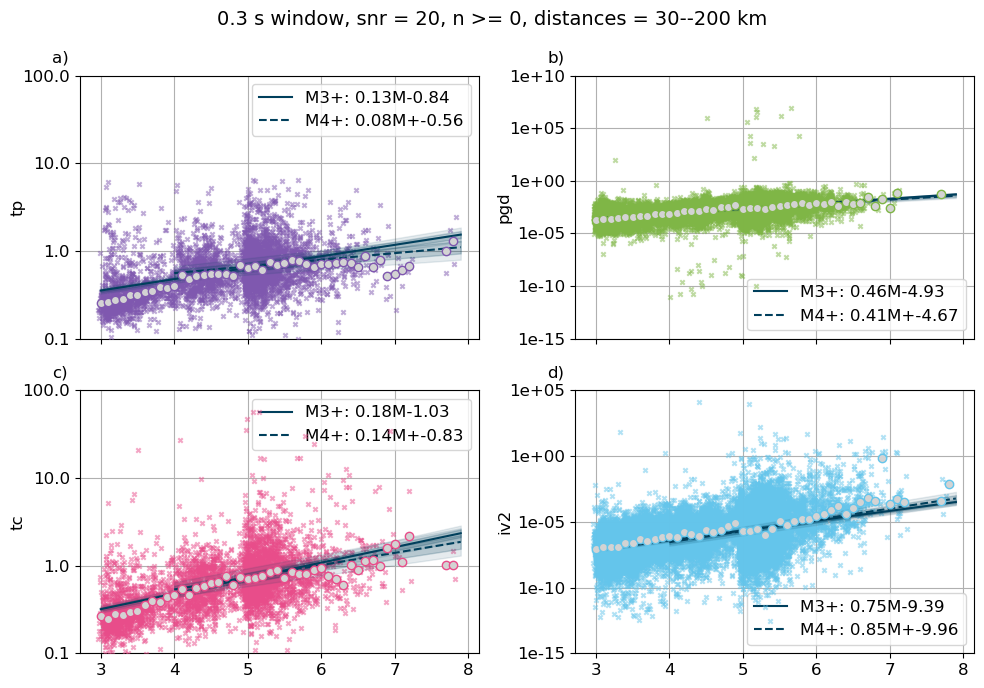

0.13021369142274325 0.0808586095886843
0.17679838418828261 0.14304042681886217


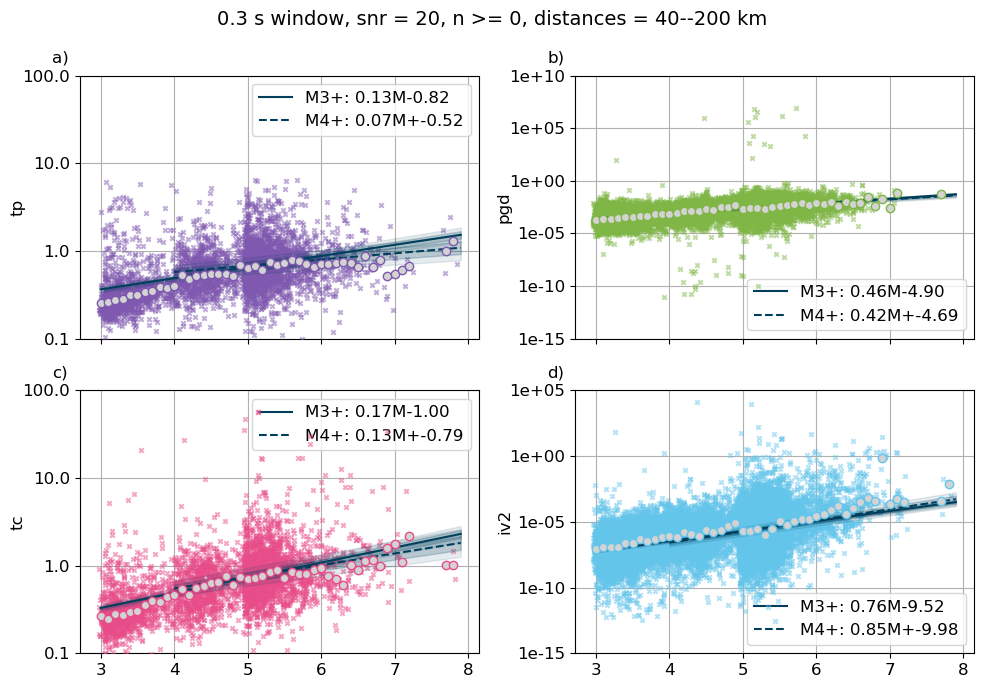

0.12704528113176453 0.07720977922636822
0.1723267384256032 0.13714321938190932


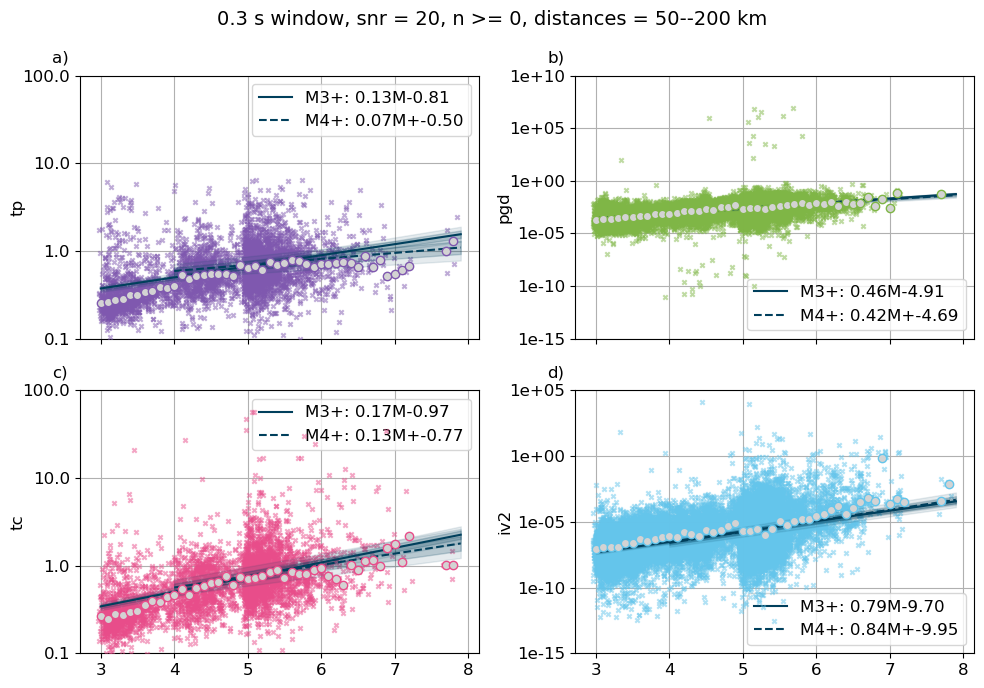

0.12633184559989932 0.07474773581120978
0.16689610336797595 0.13367998336282275


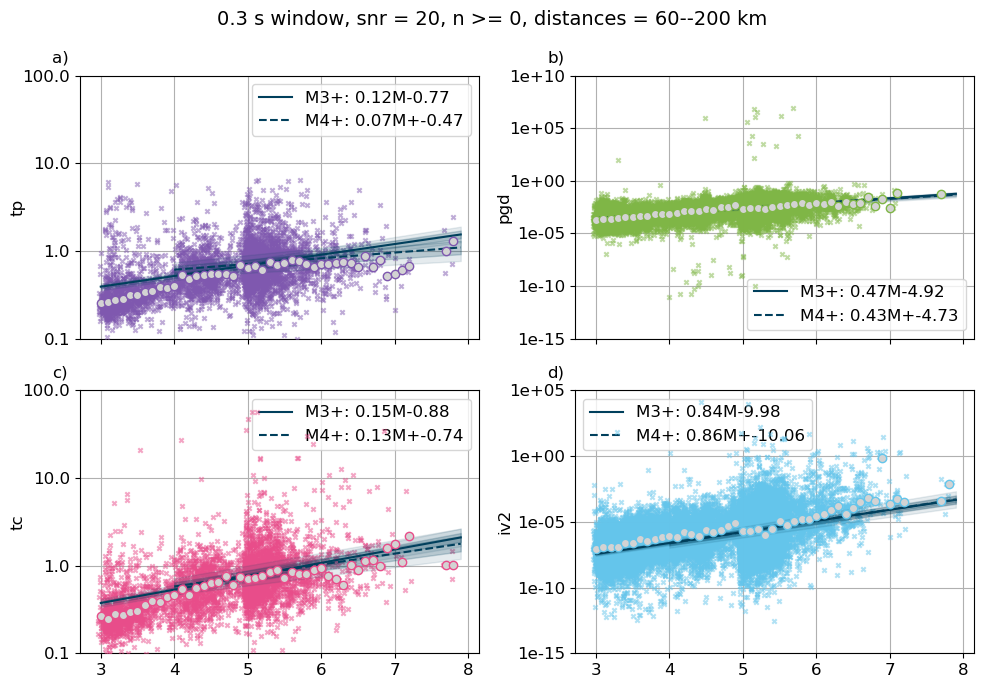

0.12158880105878898 0.07203605213155646
0.15272347246250434 0.12865802124123385


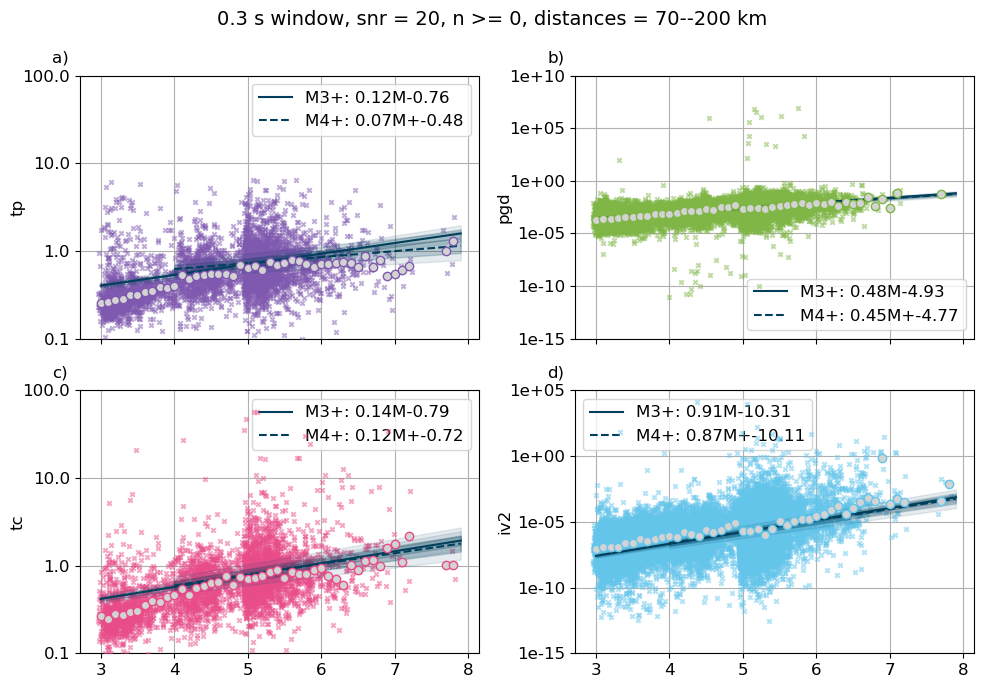

0.12143445194604507 0.07496568639244887
0.1358089820558659 0.12511138187514406


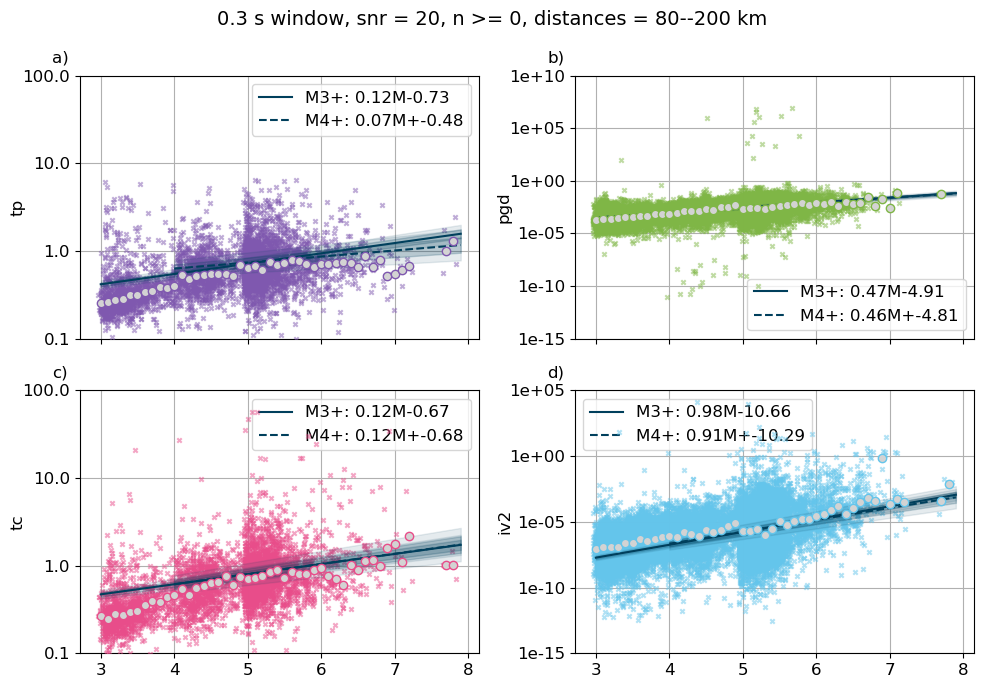

0.11766353191505659 0.07740387085968366
0.11517488547413036 0.11872439514280271


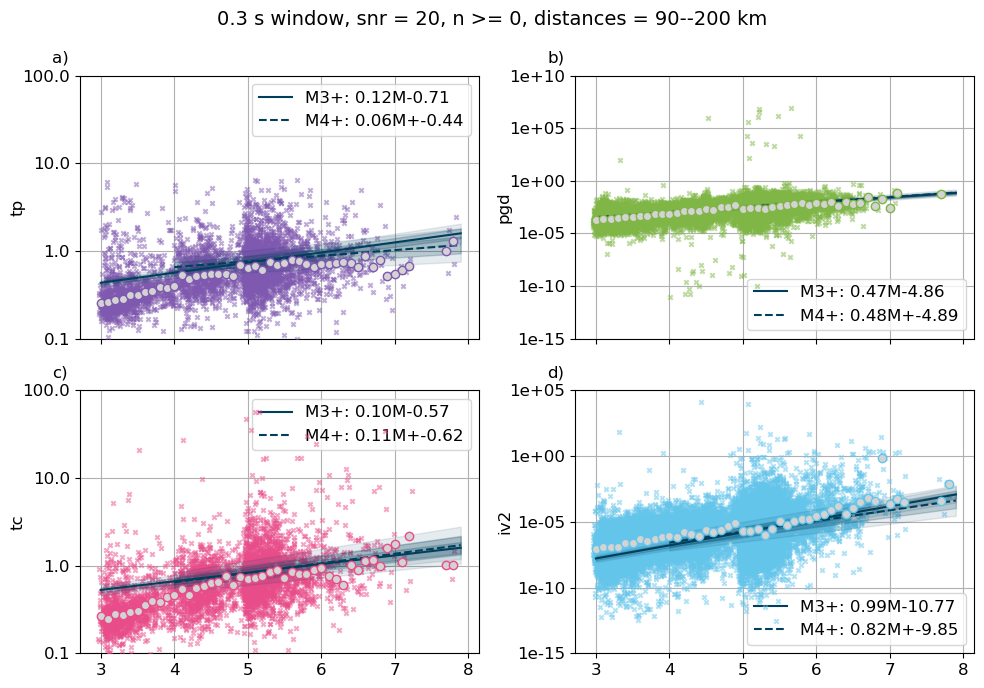

0.11512731109130427 0.07296427860713289
0.09821626482267418 0.11077063813031877


IndexError: list index out of range

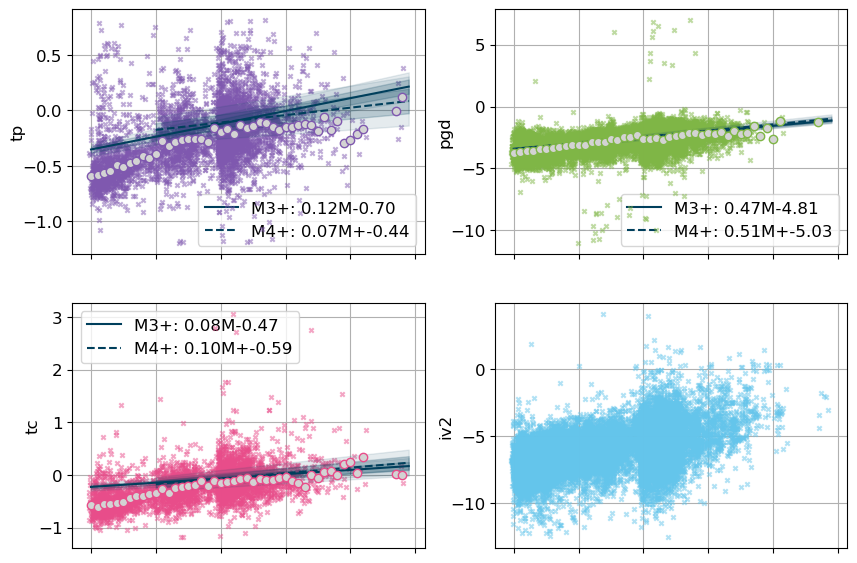

In [5]:
%matplotlib inline
min_dist = 20
max_dist = 200
n_stations = 0
for f in filenames:
    print(f)
    df = pd.read_pickle(f'/home/earthquakes1/homes/Rebecca/phd/data/results_database/{f}')
    for min_dist in range(0, 200, 10):
        x_tp, y_tp = calc_tp_mag_lim(df, 3.)
        x_pgd, y_pgd = calc_pgd_mag_lim(df, 3.)
        x_tc, y_tc = calc_tc_mag_lim(df, 3.)
        x_iv2, y_iv2 = calc_iv2_mag_lim(df, 3.)

        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_tp_mag_lim(df, mag_lim,n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        tp_params = [gradt, gradt_std, intercept, intercept_std,  'tp']
        tp_pearson = pearson
        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_pgd_mag_lim(df, mag_lim,n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'pgd', True)  
        pgd_pearson = pearson
        pgd_params = [gradt, gradt_std, intercept, intercept_std,  'pgd']

        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_tc_mag_lim(df, mag_lim,n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'pgd', True)  
        tc_params = [gradt, gradt_std, intercept, intercept_std, 'tc']
        tc_pearson = pearson
        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_iv2_mag_lim(df, mag_lim,n=n_stations, min_dist = min_dist, max_dist = max_dist)
            #print(len(x[y==0]))
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        iv2_params = [gradt, gradt_std, intercept, intercept_std, 'iv2']
        iv2_pearson = pearson

        plot_data_subplots_line([x_tp, x_pgd, x_tc, x_iv2], [y_tp, y_pgd, y_tc, y_iv2], ['tp','pgd','tc','iv2'],f, tp_params, pgd_params, tc_params, iv2_params, n = n_stations, min_dist = min_dist, max_dist = max_dist, save = True, show = True)
        #plot_spearman_subplots_all_on_one_no_n_shaded(f, tp_params, pgd_params, iv2_params, tc_params, save = False)
        #print(tp_params[4][0], tc_params[4][0])
        #plot_spearman_subplots_all_on_one_no_n_shaded(f, gradt, gradt_std, spearman, spearman_p, n, 'iv2', True) 
        print(tp_params[0][0],tp_params[0][9])
        print(tc_params[0][0],tc_params[0][9])


## lines 2 magnitude units long

eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


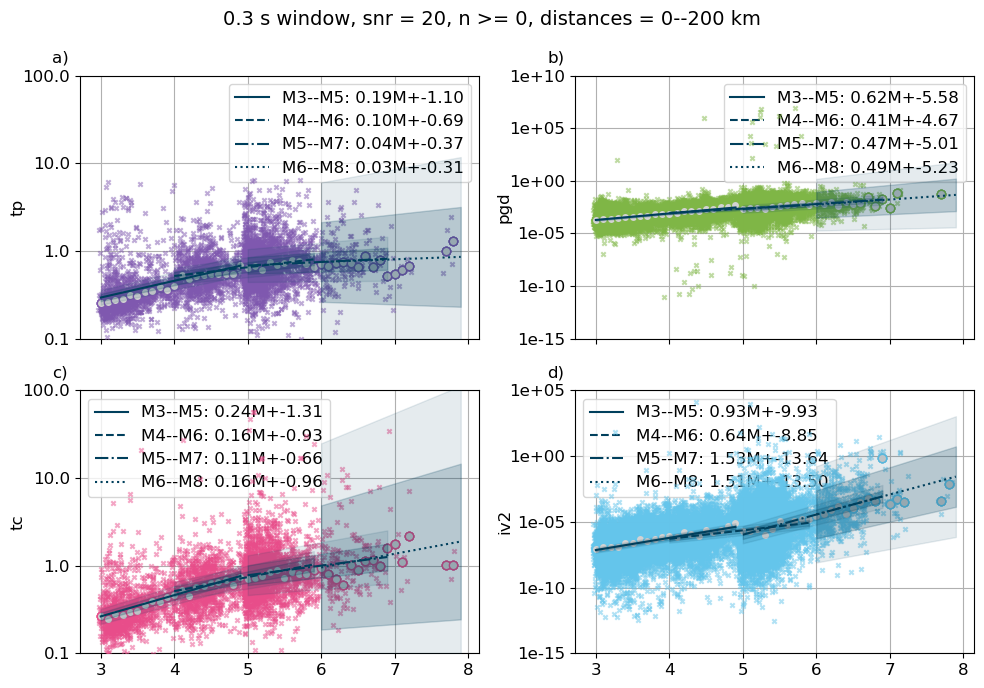

0.1910285907982128 0.11578764476929404
0.24207366751333323 0.16458583288676187
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


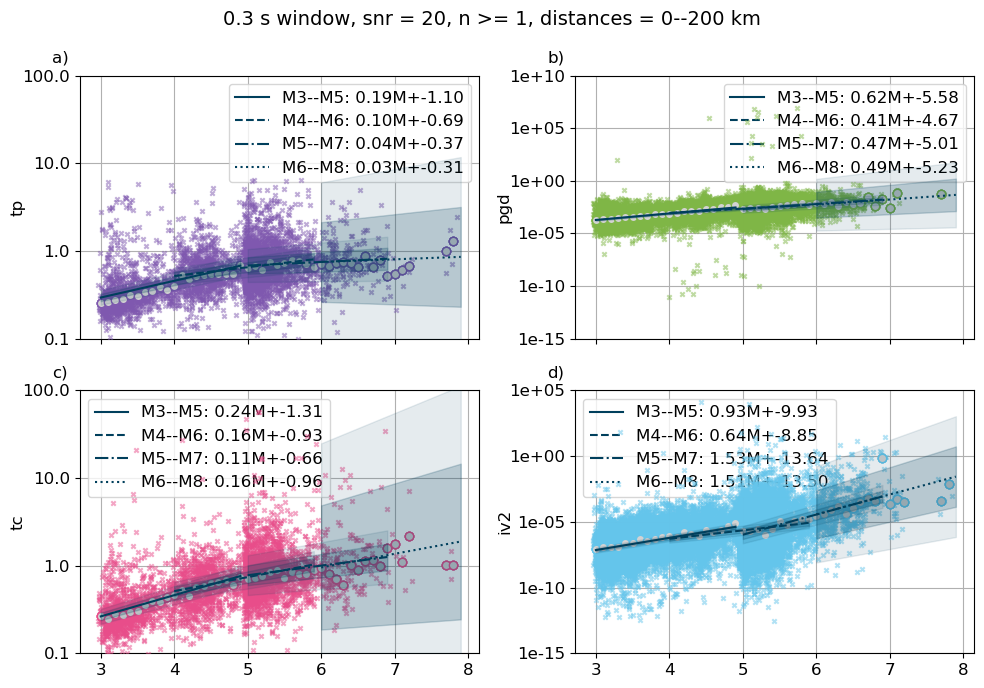

0.1910285907982128 0.11578764476929404
0.24207366751333323 0.16458583288676187
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


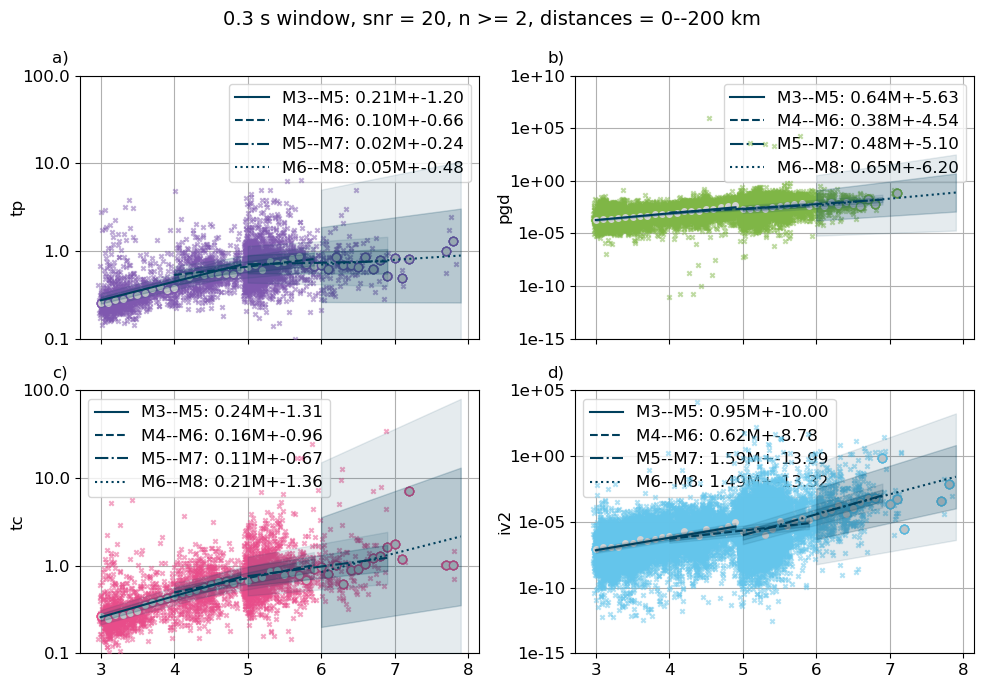

0.21251895059153114 0.1257358646739624
0.2402622653884945 0.17165247467308575
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


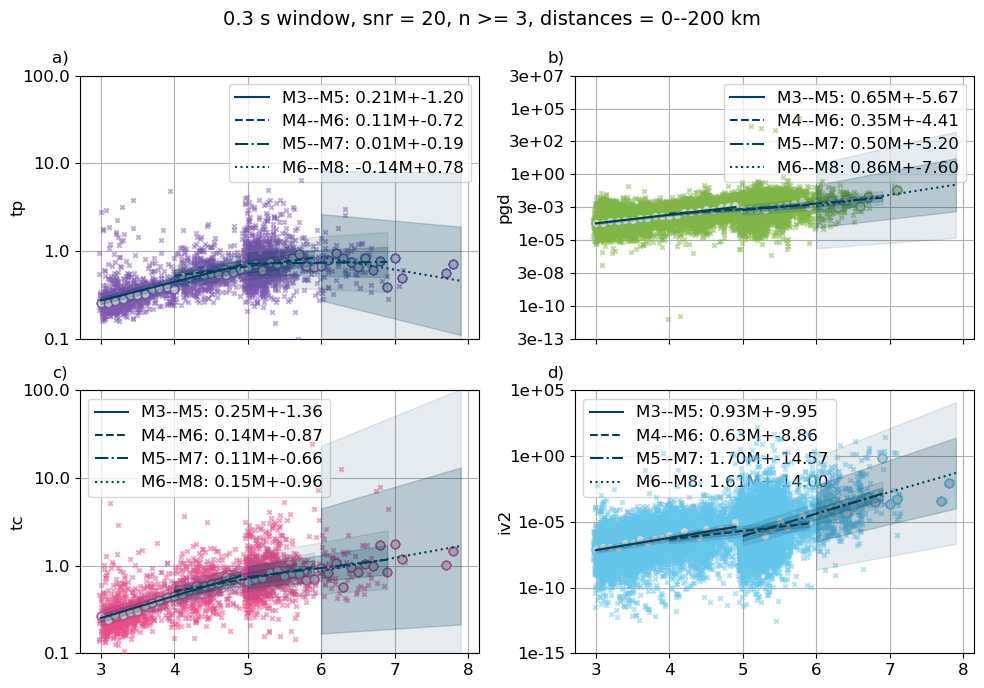

0.21209654727136648 0.13815084838476563
0.2524160326583656 0.15099442364031967
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


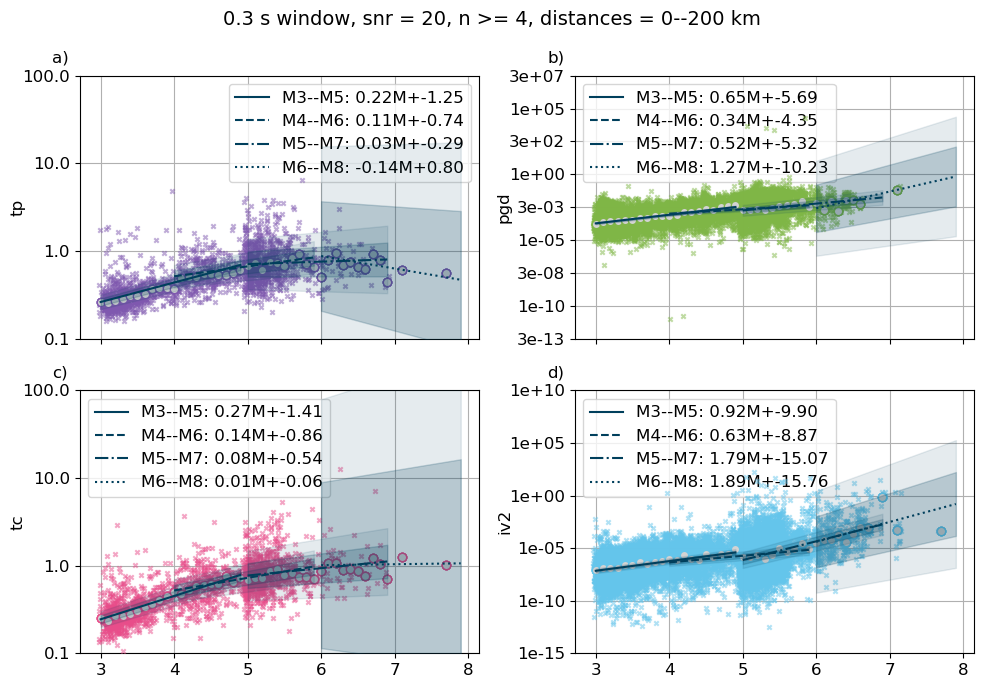

0.22234778925074844 0.14636722159986007
0.26614279842963695 0.16158858820877875
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


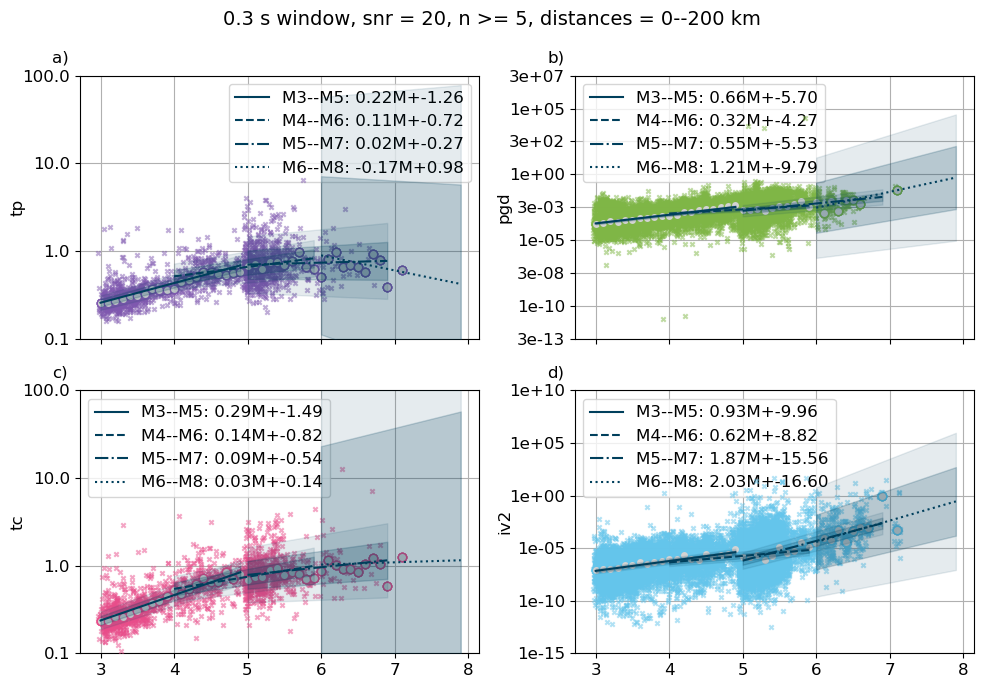

0.22385657623707664 0.14992379480790333
0.2892413238461509 0.15119155391501318
eq_object_05s_bandpass_01_19_snr_20_blank_0_new_snr20


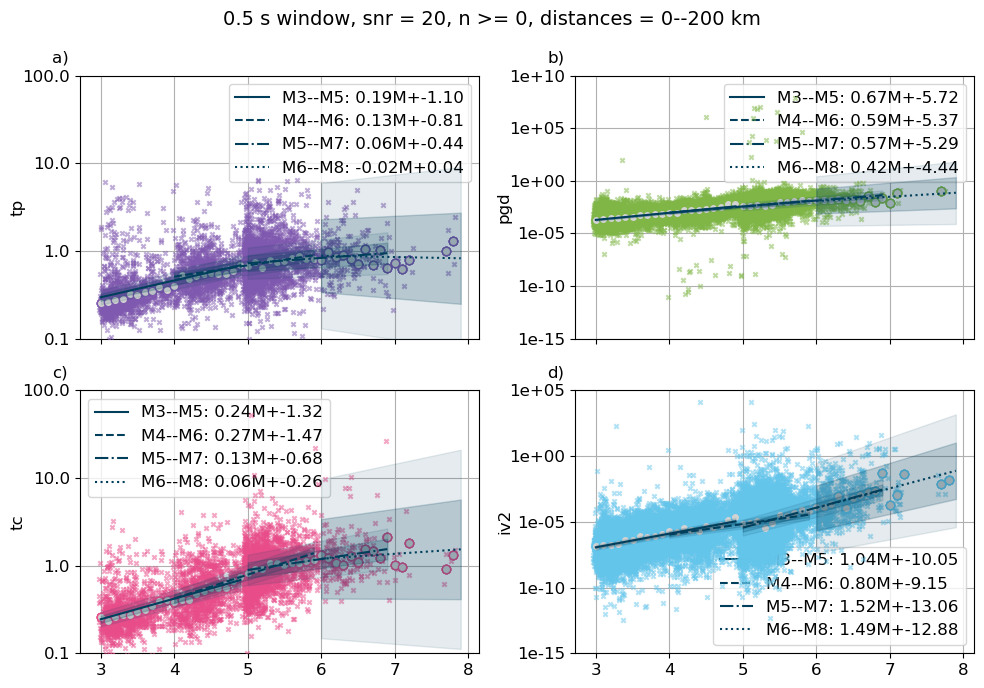

0.19205639446487321 0.14287219509111126
0.2352006487812307 0.27803472560308773
eq_object_05s_bandpass_01_19_snr_20_blank_0_new_snr20


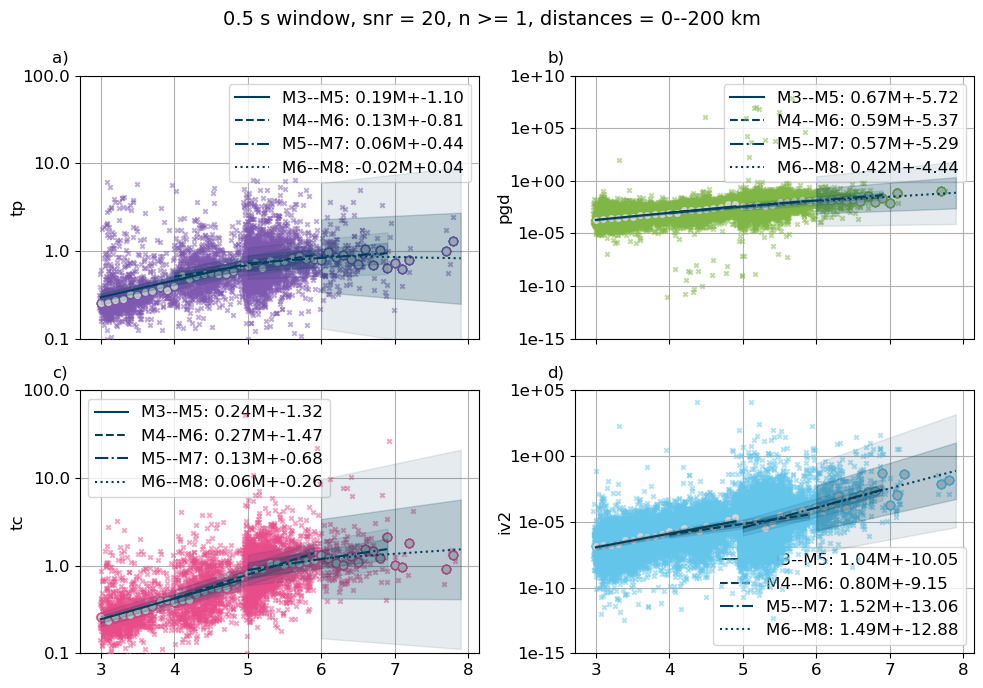

0.19205639446487321 0.14287219509111126
0.2352006487812307 0.27803472560308773
eq_object_05s_bandpass_01_19_snr_20_blank_0_new_snr20


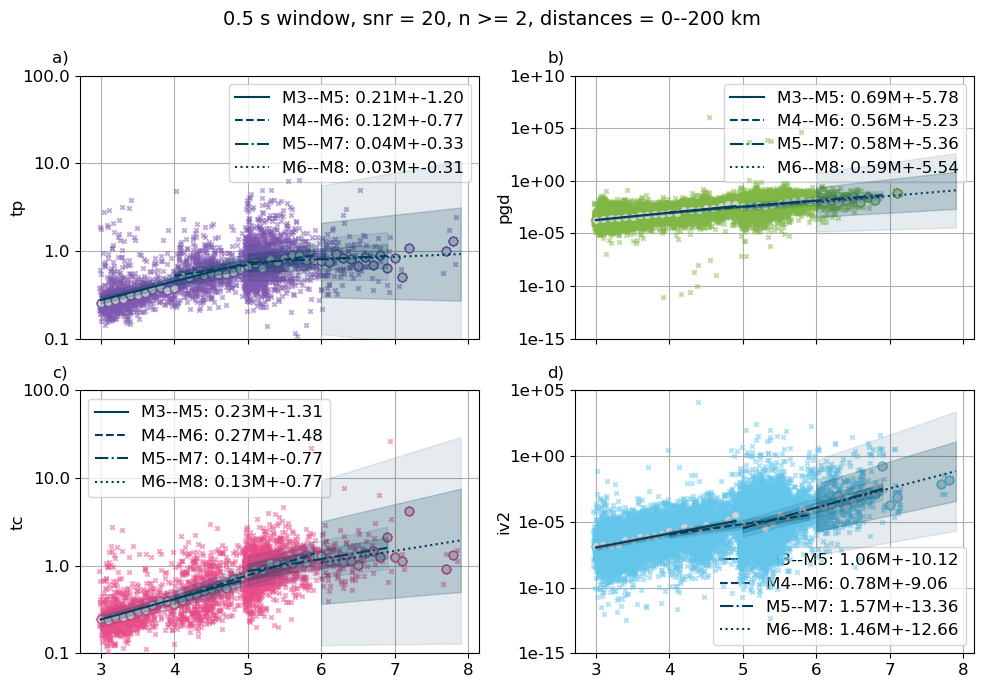

0.21287523640646275 0.15003939881048695
0.2316815276243447 0.2838807014759201
eq_object_05s_bandpass_01_19_snr_20_blank_0_new_snr20


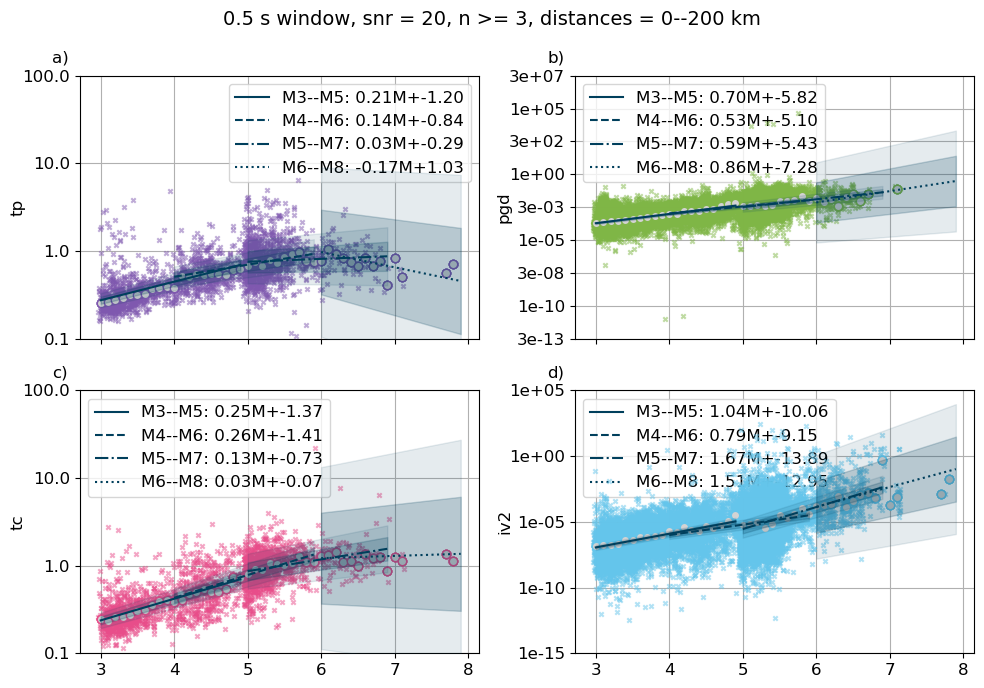

0.21205151678097384 0.16326082215014598
0.24686533900853816 0.27227726909867306
eq_object_05s_bandpass_01_19_snr_20_blank_0_new_snr20


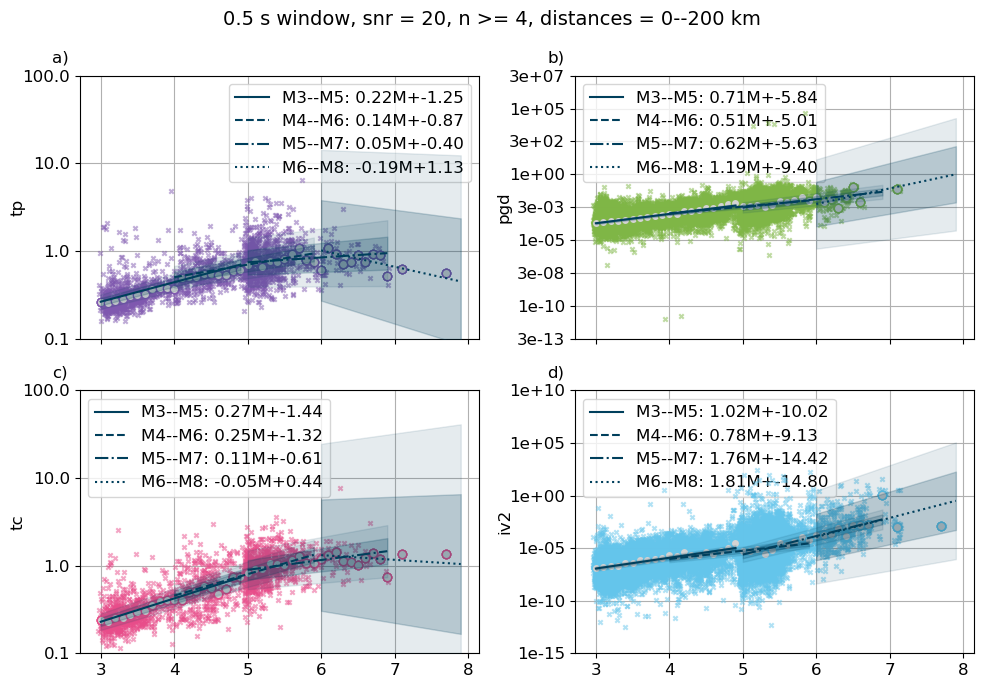

0.22258021216901527 0.17091391668269795
0.2659046074171257 0.2676231000707473
eq_object_05s_bandpass_01_19_snr_20_blank_0_new_snr20


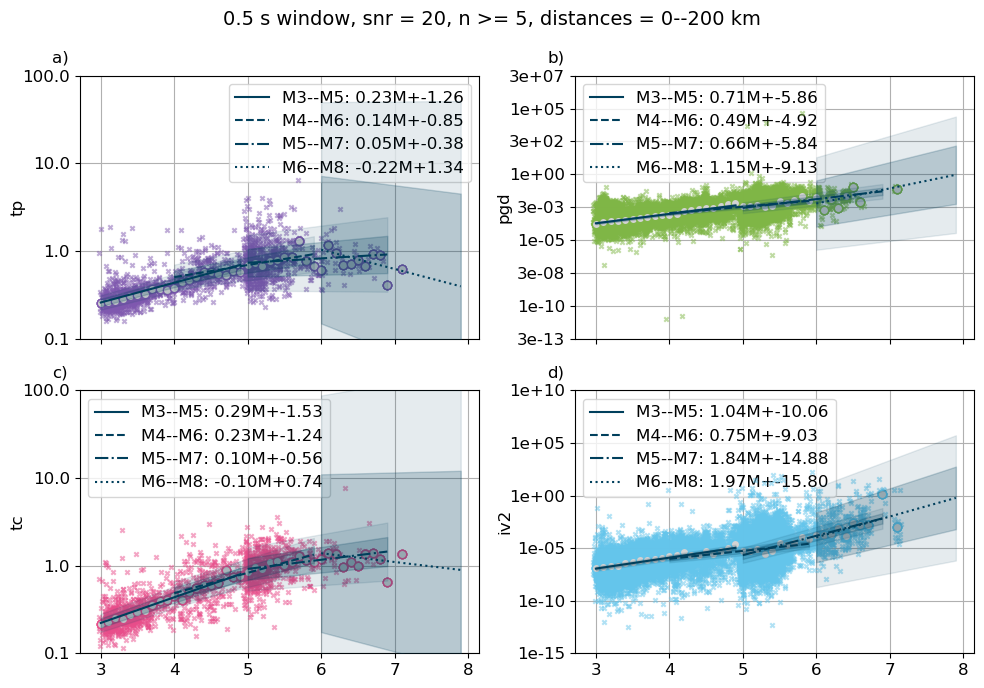

0.22541330443099175 0.17429859862432073
0.29288611264174763 0.254107836847864
eq_object_1s_bandpass_01_19_snr_20_blank_0_new_snr20


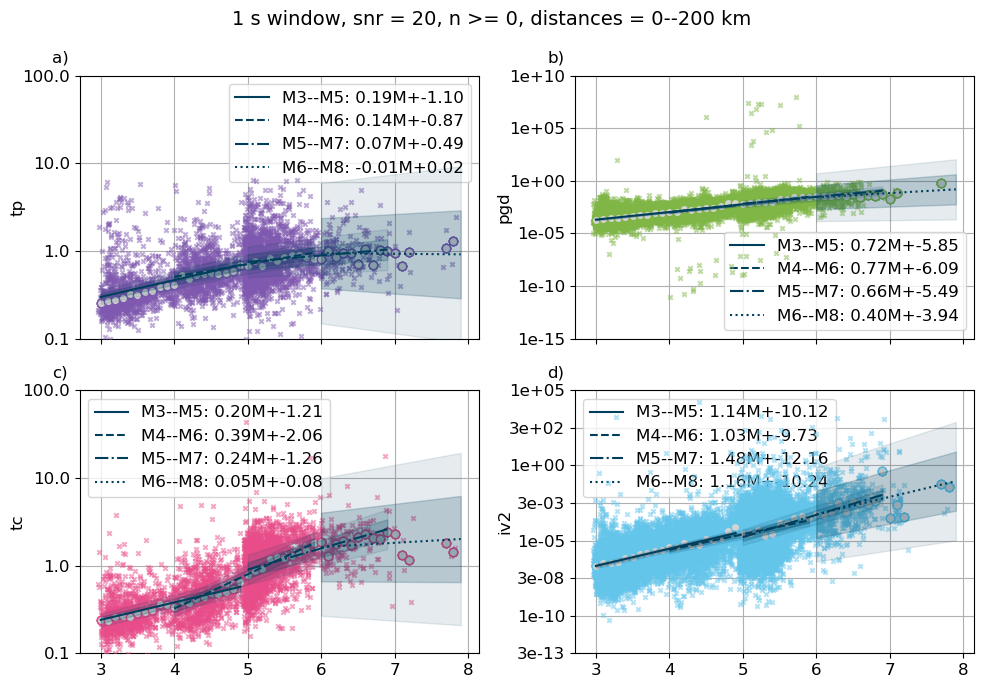

0.19228211678192575 0.15777593107446716
0.19863857572043134 0.39022777038918954
eq_object_1s_bandpass_01_19_snr_20_blank_0_new_snr20


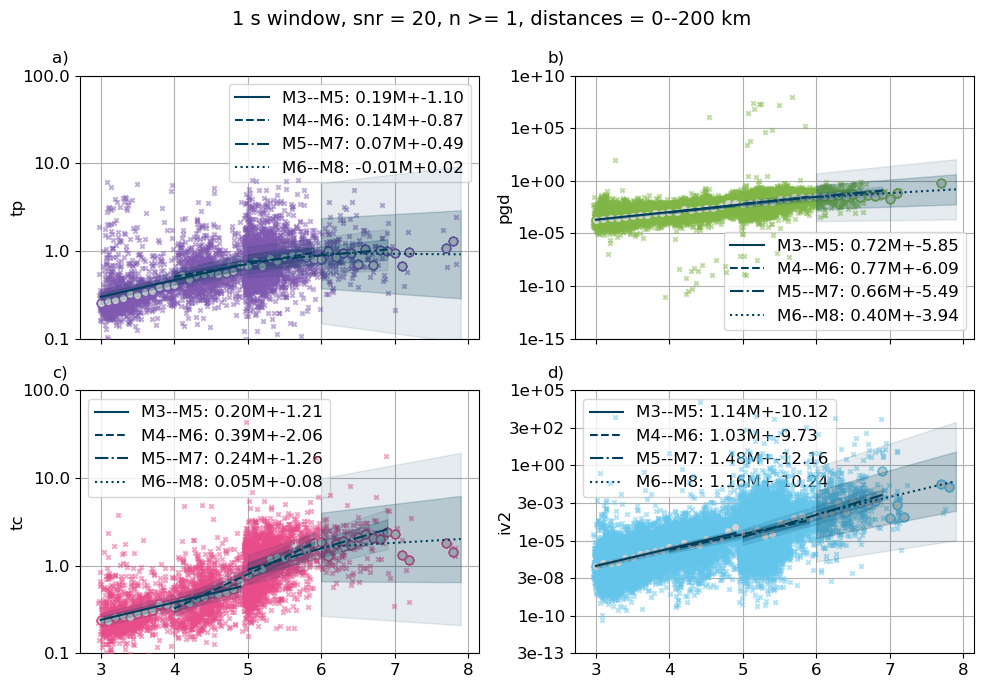

0.19228211678192575 0.15777593107446716
0.19863857572043134 0.39022777038918954
eq_object_1s_bandpass_01_19_snr_20_blank_0_new_snr20


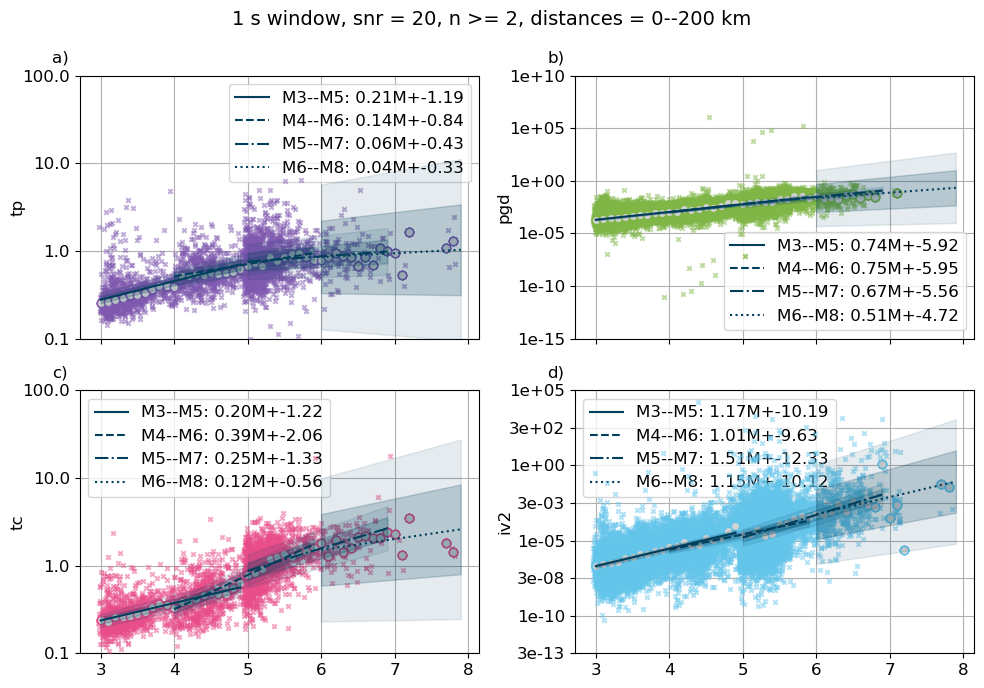

0.21169106755506956 0.16523498787583404
0.19939724118933078 0.39210607703552014
eq_object_1s_bandpass_01_19_snr_20_blank_0_new_snr20


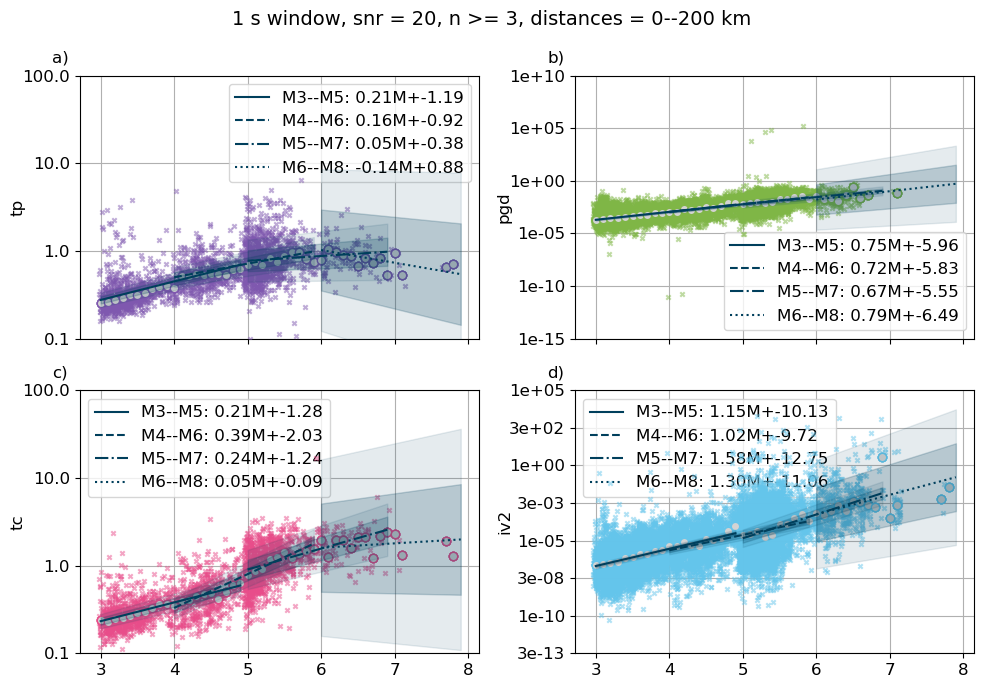

0.21152290747401997 0.17895317668951632
0.21388997609540547 0.3851865530054332
eq_object_1s_bandpass_01_19_snr_20_blank_0_new_snr20


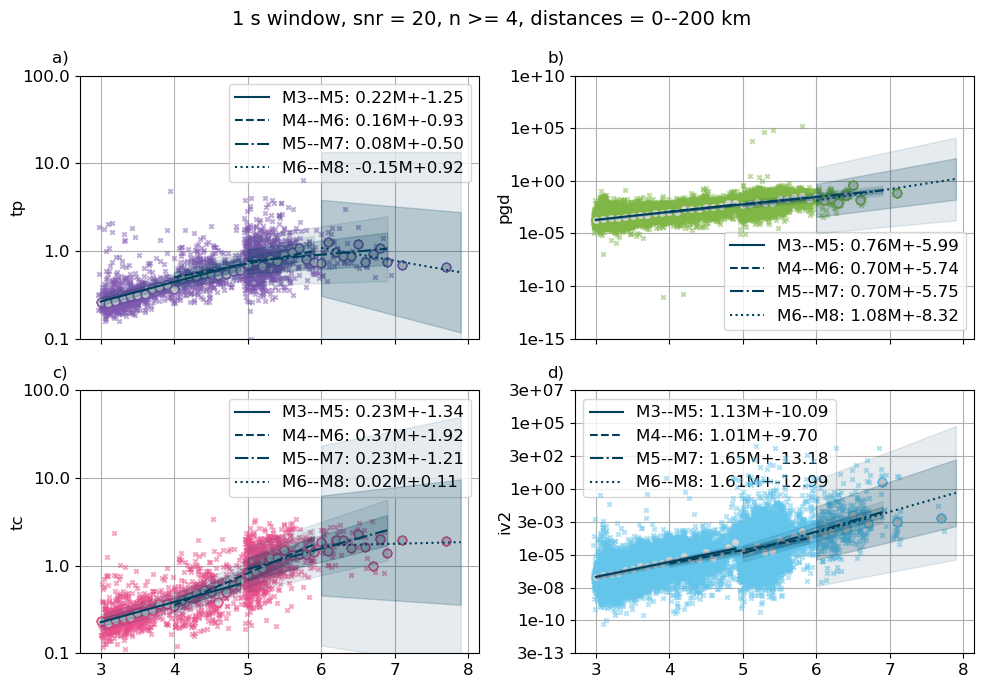

0.22320858482804432 0.18385672191392957
0.2306180227833036 0.3742776370268181
eq_object_1s_bandpass_01_19_snr_20_blank_0_new_snr20


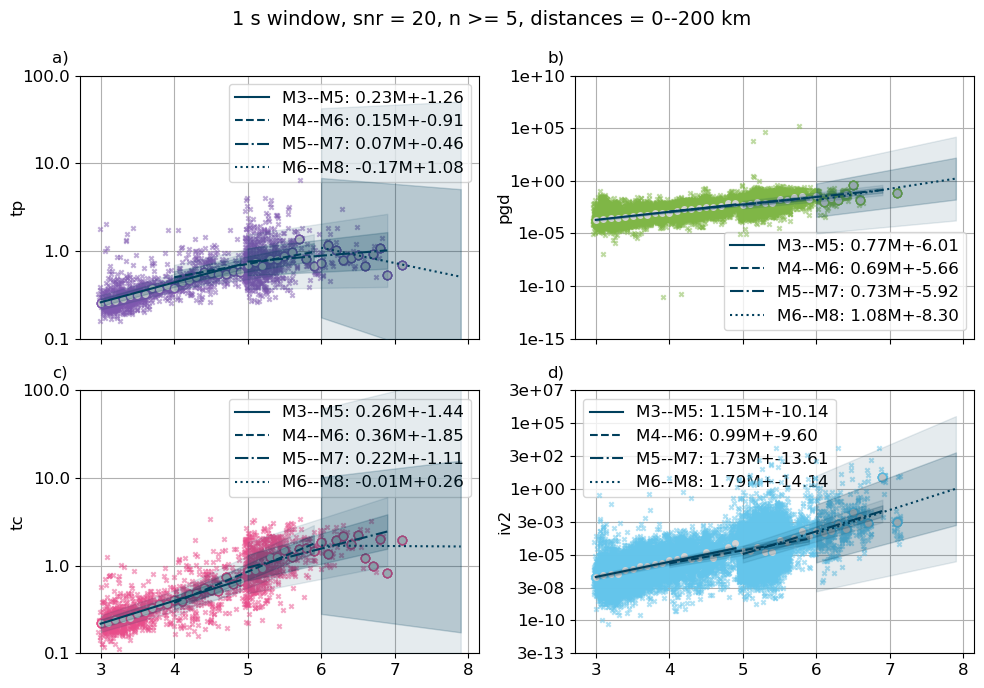

0.22632029359175743 0.18708544920518963
0.26049557760543735 0.3626057517297502
eq_object_4s_bandpass_01_19_snr_20_blank_0_new_snr20


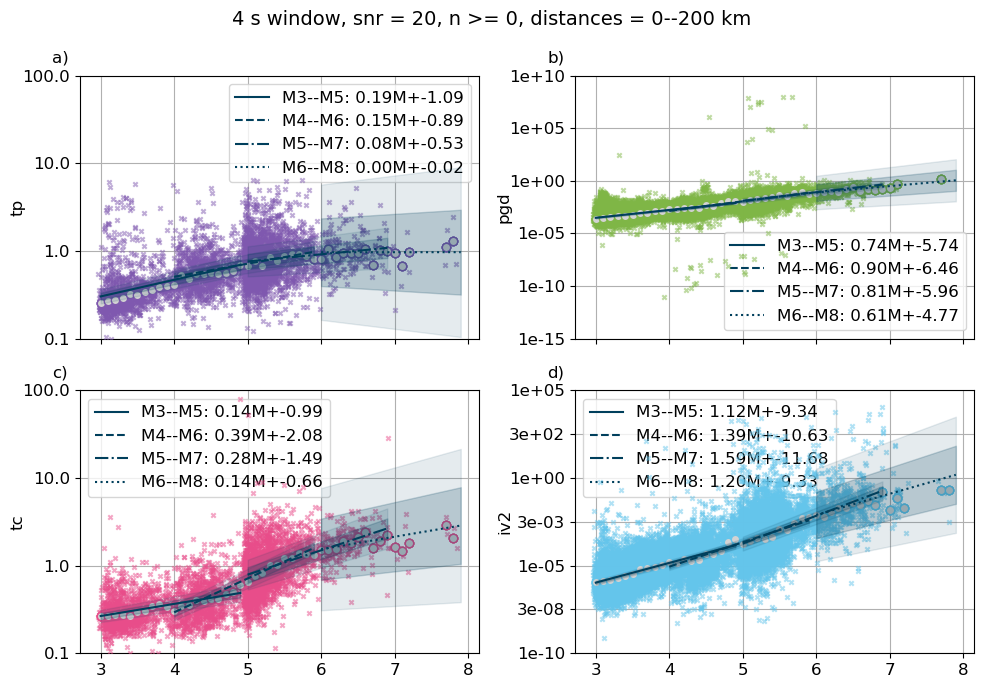

0.1898286087980821 0.16250705442910057
0.13833610156646842 0.3884481672255431
eq_object_4s_bandpass_01_19_snr_20_blank_0_new_snr20


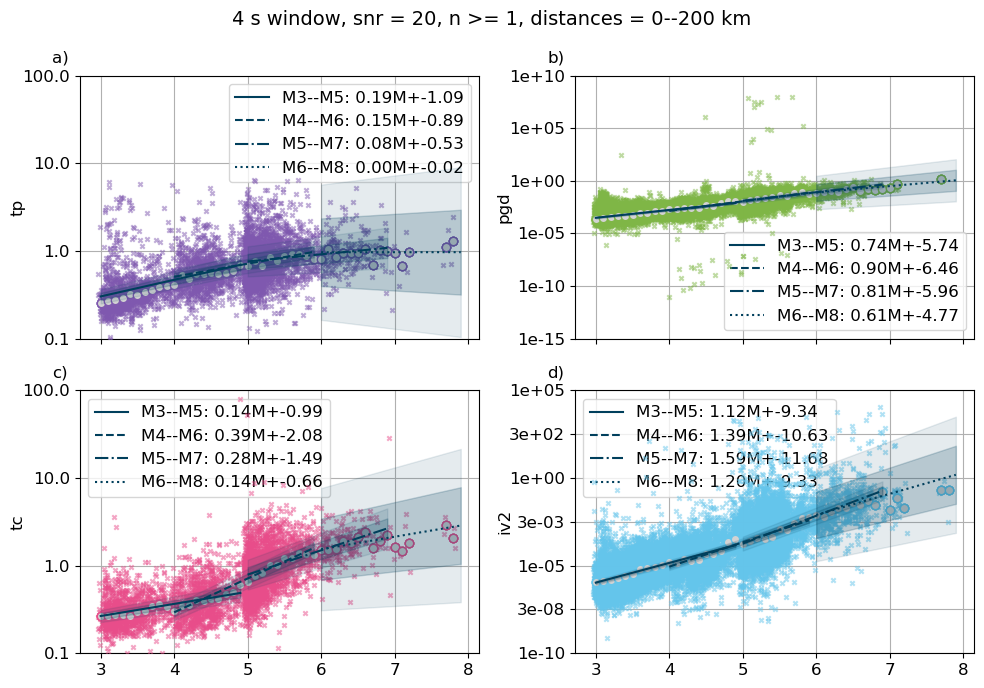

0.1898286087980821 0.16250705442910057
0.13833610156646842 0.3884481672255431
eq_object_4s_bandpass_01_19_snr_20_blank_0_new_snr20


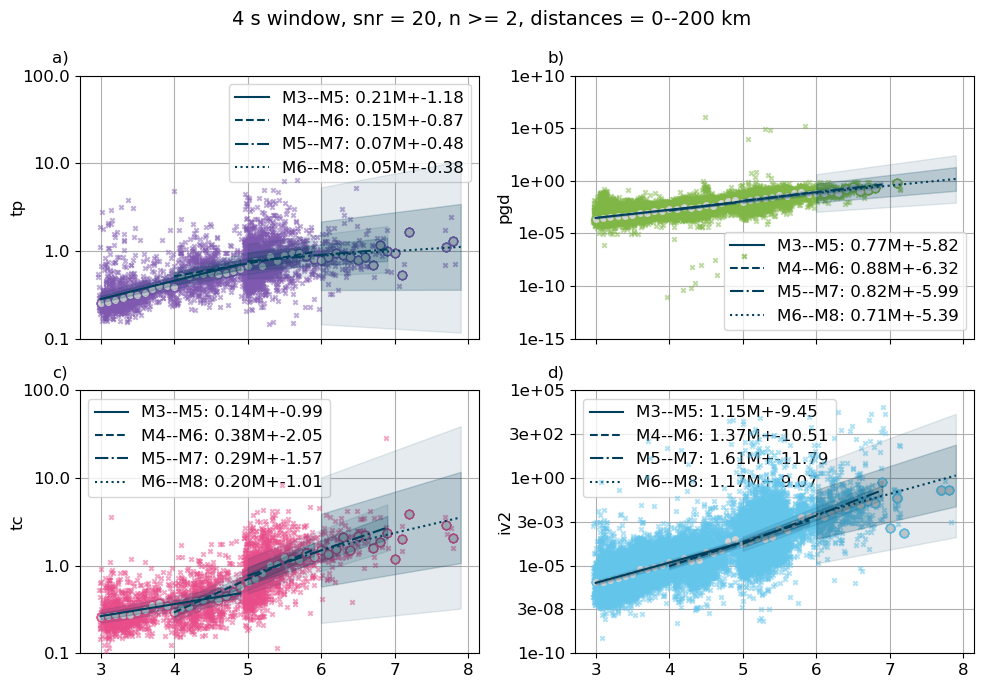

0.20915703775801764 0.1710962924469608
0.13719919773196657 0.38336472754989503
eq_object_4s_bandpass_01_19_snr_20_blank_0_new_snr20


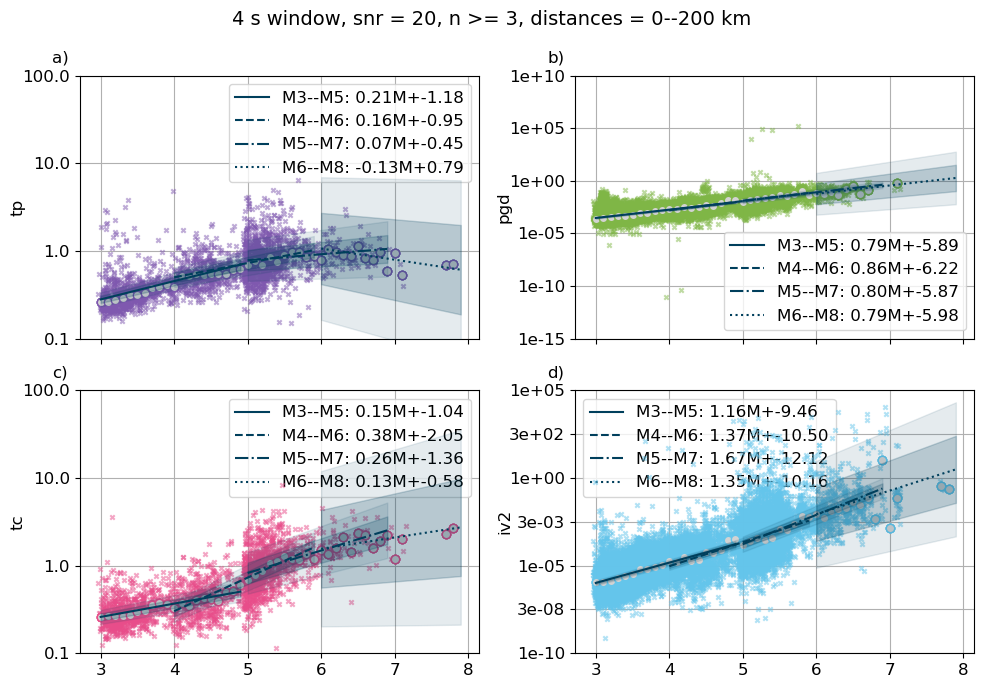

0.20884568247242263 0.18598919840530698
0.15160160336506603 0.3873503366714873
eq_object_4s_bandpass_01_19_snr_20_blank_0_new_snr20


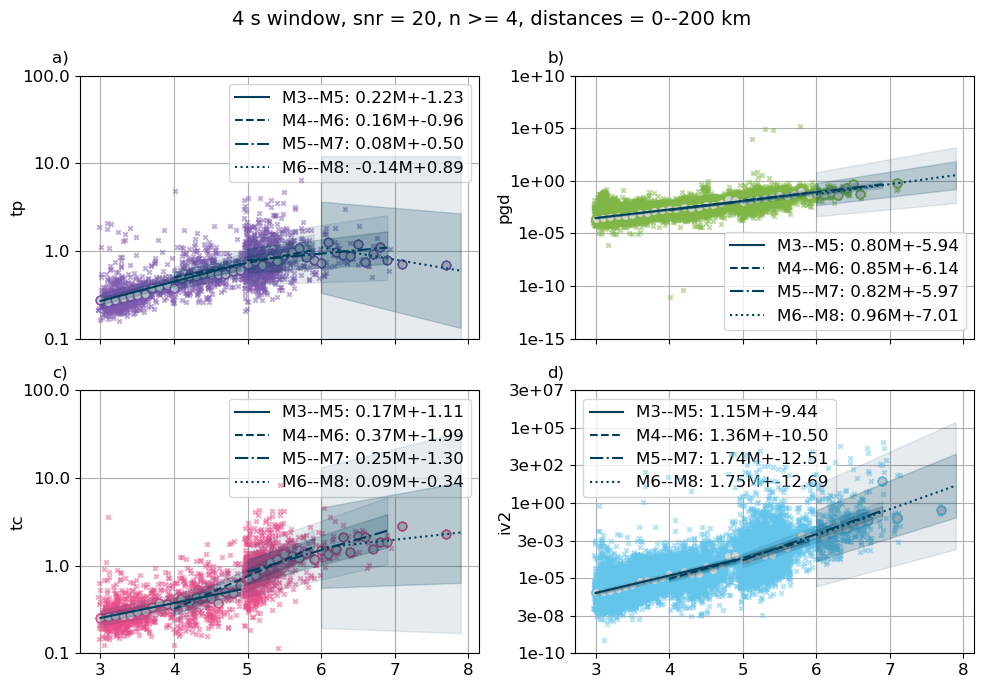

0.22118119353544669 0.19069568194331132
0.17008763379211644 0.38288767882554703
eq_object_4s_bandpass_01_19_snr_20_blank_0_new_snr20


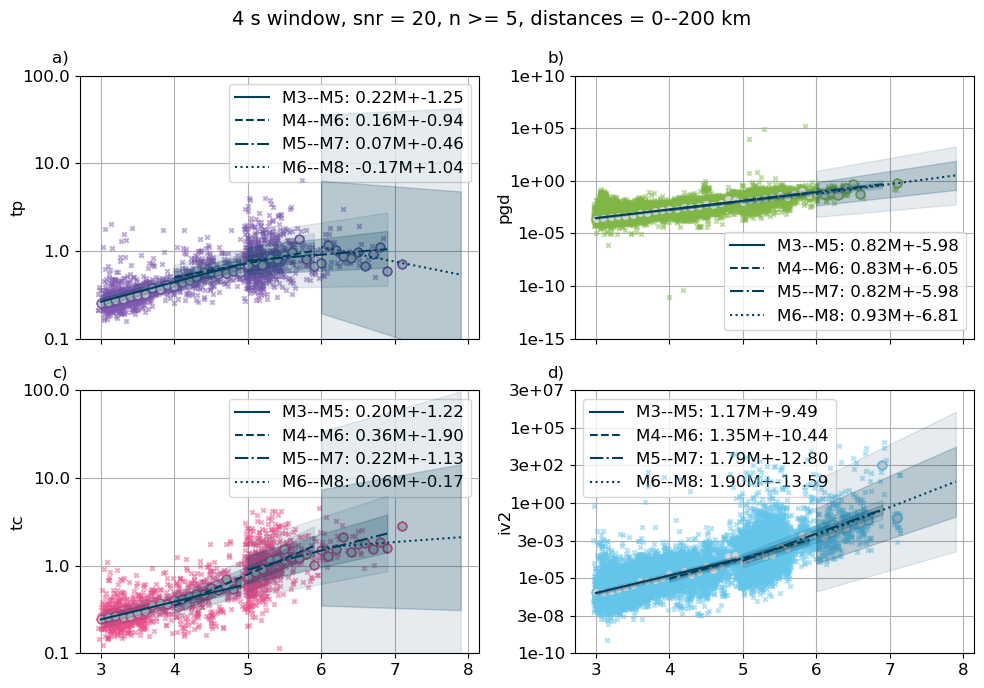

0.22443304537084174 0.1937566152344866
0.20200970742751517 0.3717586469743231


In [25]:
%matplotlib inline
min_dist = 0
max_dist = 200
for f in filenames:
    for n_stations in range(0, 6, 1):
        print(f)
        df = pd.read_pickle(f'/home/earthquakes1/homes/Rebecca/phd/data/results_database/{f}')
        #n_stations = 0
        x_tp, y_tp = calc_tp_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_pgd, y_pgd = calc_pgd_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_tc, y_tc = calc_tc_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_iv2, y_iv2 = calc_iv2_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)


        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_tp_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        tp_params = [gradt, gradt_std, intercept, intercept_std,  'tp']
        tp_pearson = pearson
        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_pgd_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'pgd', True)  
        pgd_pearson = pearson
        pgd_params = [gradt, gradt_std, intercept, intercept_std,  'pgd']

        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_tc_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'pgd', True)  
        tc_params = [gradt, gradt_std, intercept, intercept_std, 'tc']
        tc_pearson = pearson
        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_iv2_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            #print(len(x[y==0]))
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        iv2_params = [gradt, gradt_std, intercept, intercept_std, 'iv2']
        iv2_pearson = pearson

        plot_data_subplots_line_m2([x_tp, x_pgd, x_tc, x_iv2], [y_tp, y_pgd, y_tc, y_iv2], ['tp','pgd','tc','iv2'],f, tp_params, pgd_params, tc_params, iv2_params, n = n_stations, min_dist = min_dist, max_dist = max_dist, save = True, show = True)
        #plot_spearman_subplots_all_on_one_no_n_shaded(f, tp_params, pgd_params, iv2_params, tc_params, save = False)
        #print(tp_params[4][0], tc_params[4][0])
        #plot_spearman_subplots_all_on_one_no_n_shaded(f, gradt, gradt_std, spearman, spearman_p, n, 'iv2', True) 
        print(tp_params[0][0],tp_params[0][9])
        print(tc_params[0][0],tc_params[0][9])


eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


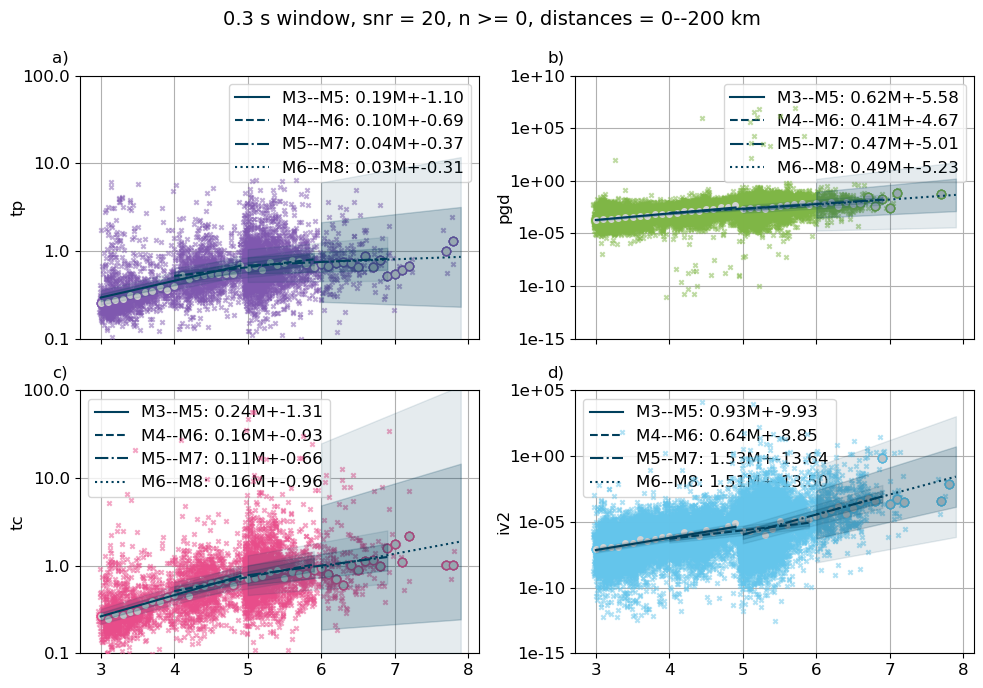

0.1910285907982128 0.11578764476929404
0.24207366751333323 0.16458583288676187
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


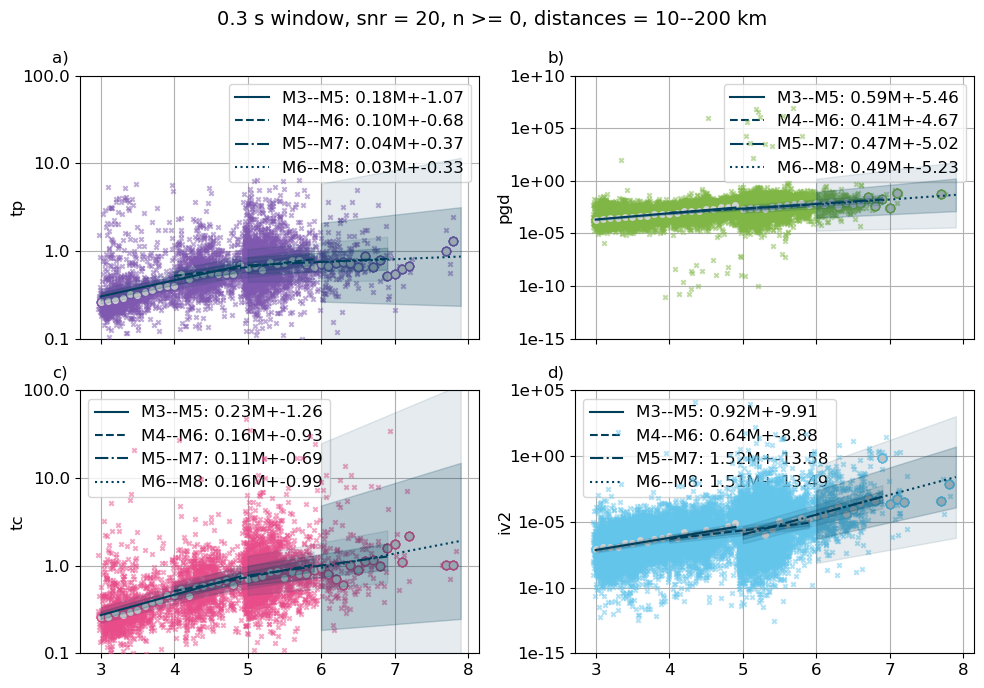

0.1845069191808298 0.11563314815575496
0.2321067815473891 0.1632785855637844
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


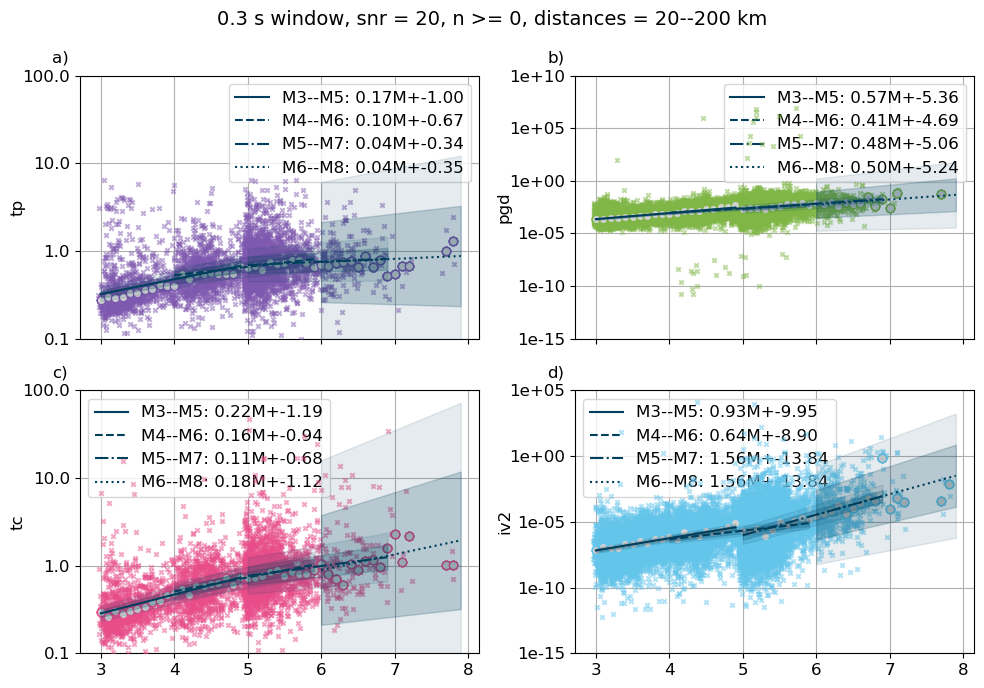

0.16873161143743096 0.11314720543943847
0.21511310885259252 0.16271996277203649
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


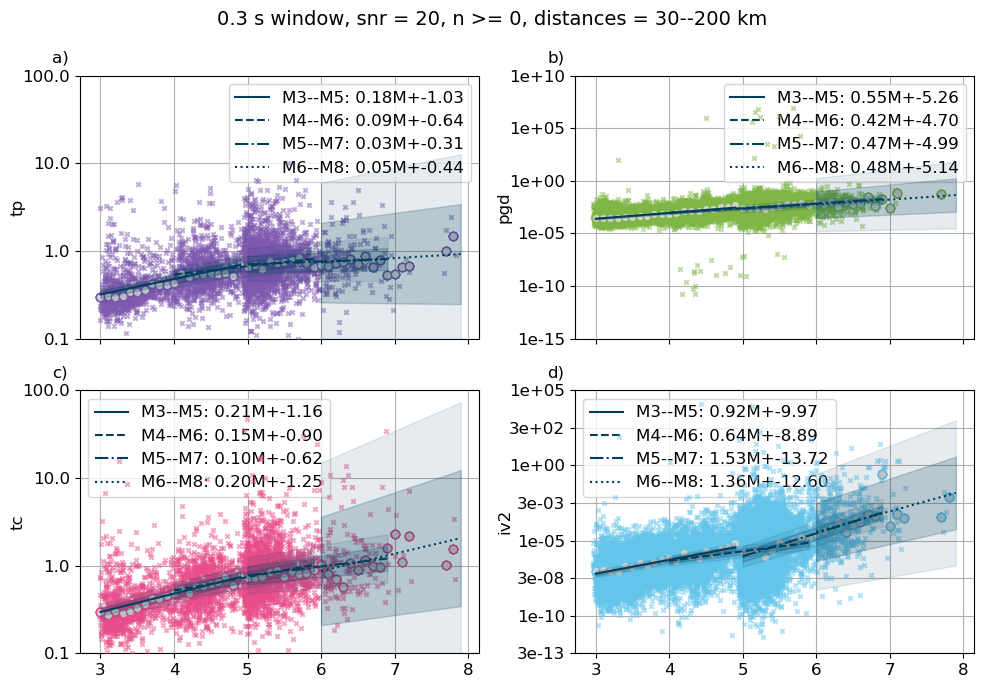

0.17702831554950335 0.11012105156091914
0.20907742094229073 0.155994274813512
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


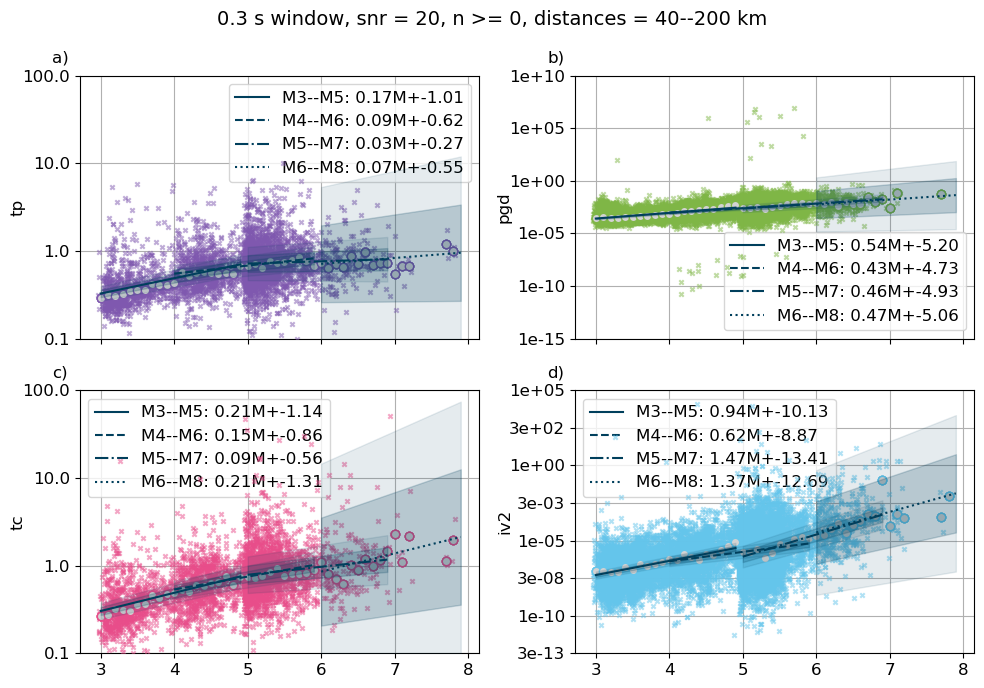

0.17486497497142361 0.10802811992381664
0.2074541240452757 0.1499626460556693
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


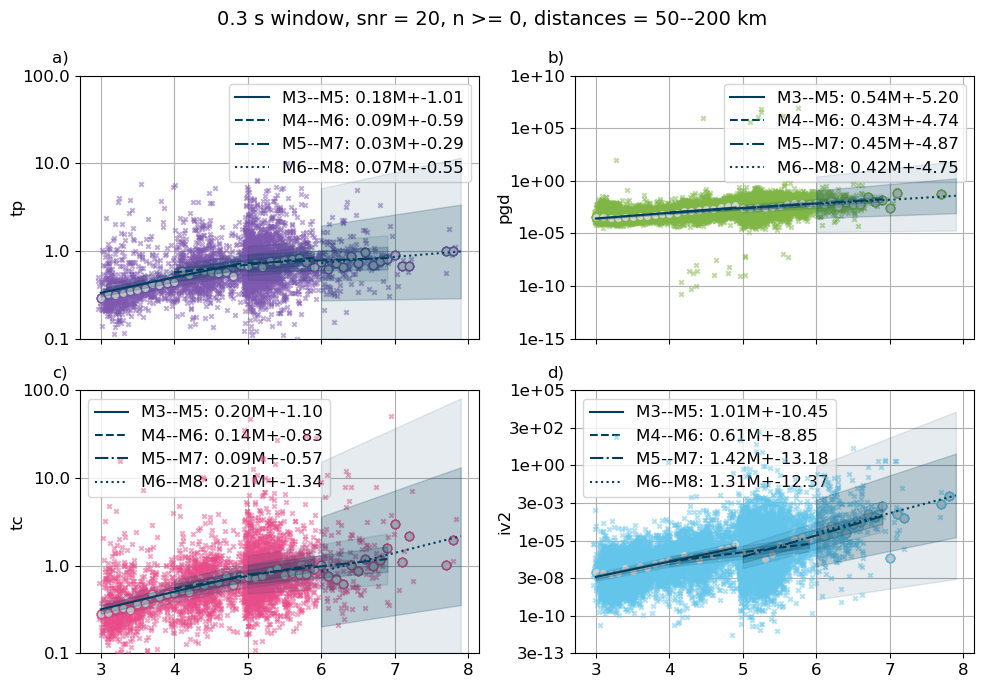

0.17608883850163512 0.10420290340417729
0.20090165856368253 0.14582309730902224
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


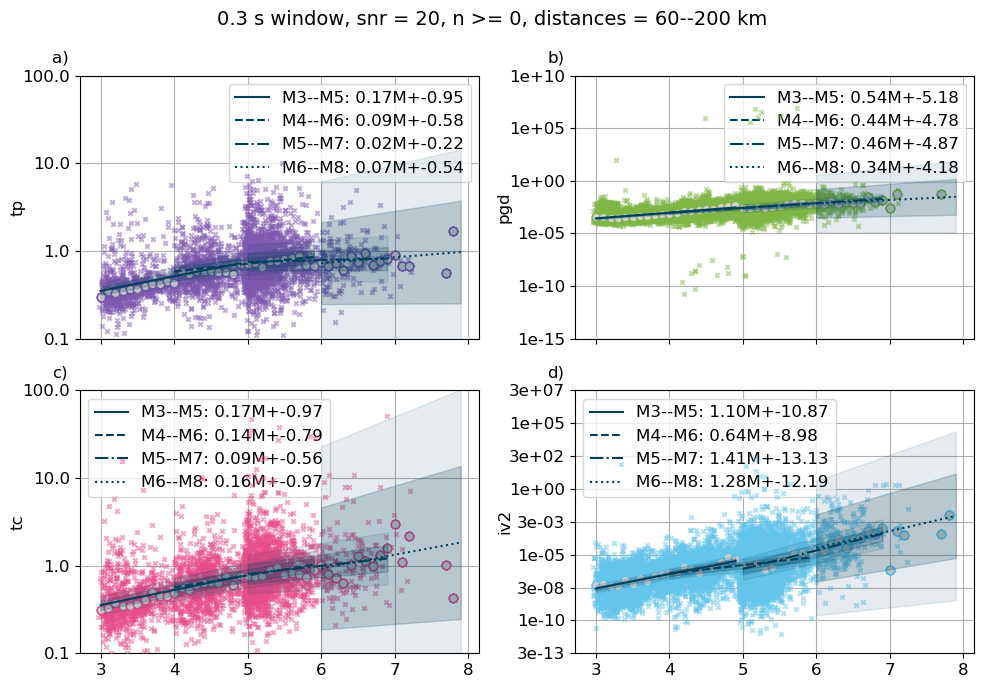

0.16614673825773313 0.10625608607396637
0.17196159459740518 0.14024165380135256
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


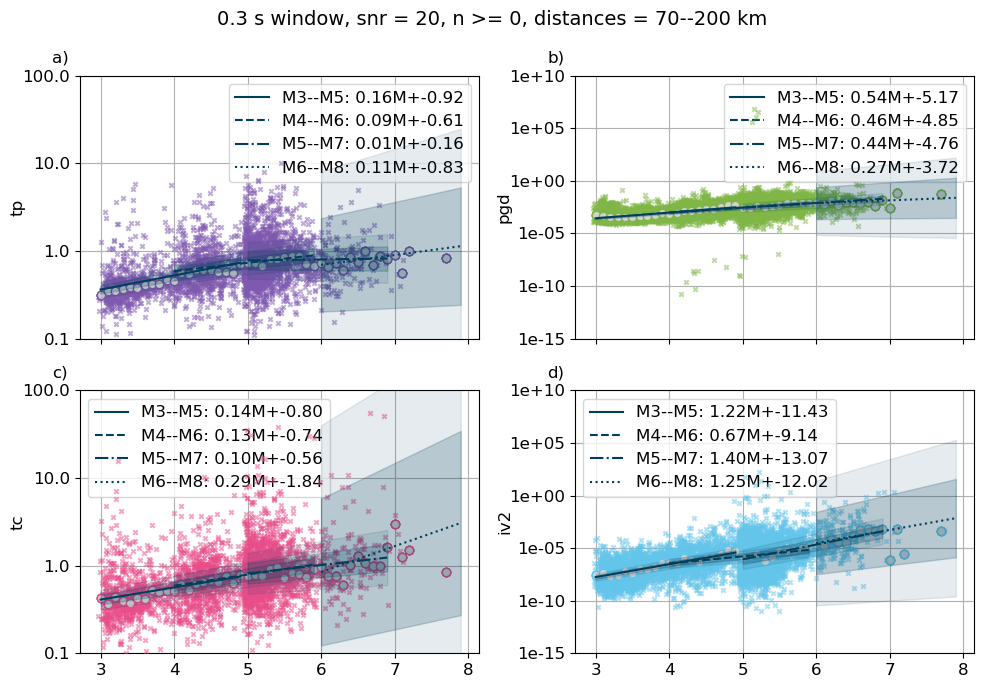

0.16134125867107768 0.11463386516770223
0.1379894661931773 0.13047501381225504
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


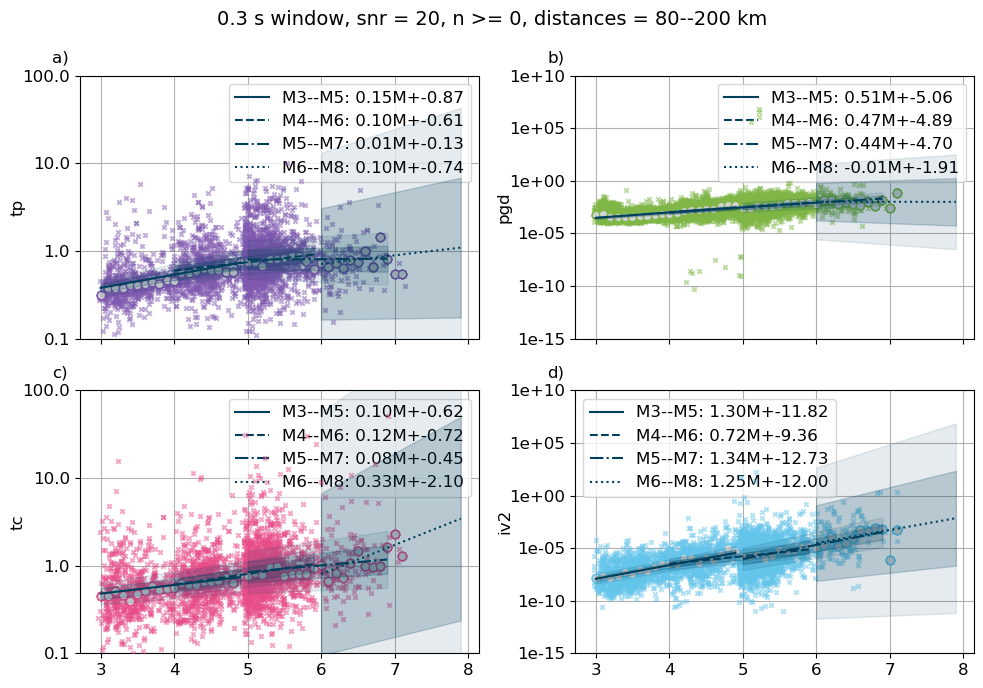

0.15039915068425763 0.1209543860458004
0.09888302400430762 0.12725646030086843
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


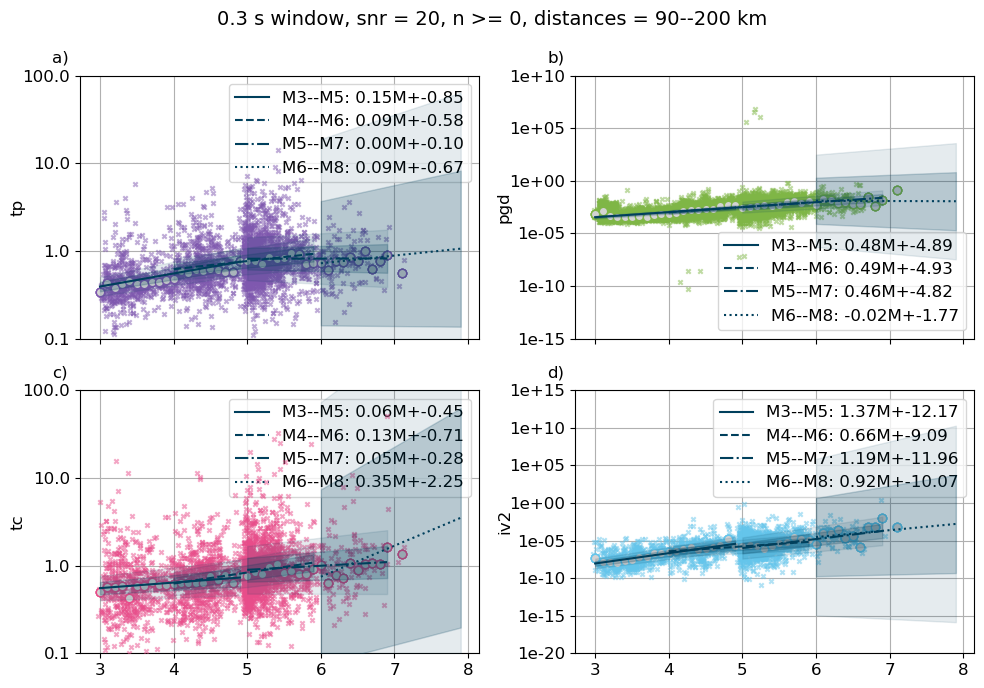

0.1486771125474712 0.11773408860542892
0.06352131756005536 0.13130104086853794
eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


IndexError: list index out of range

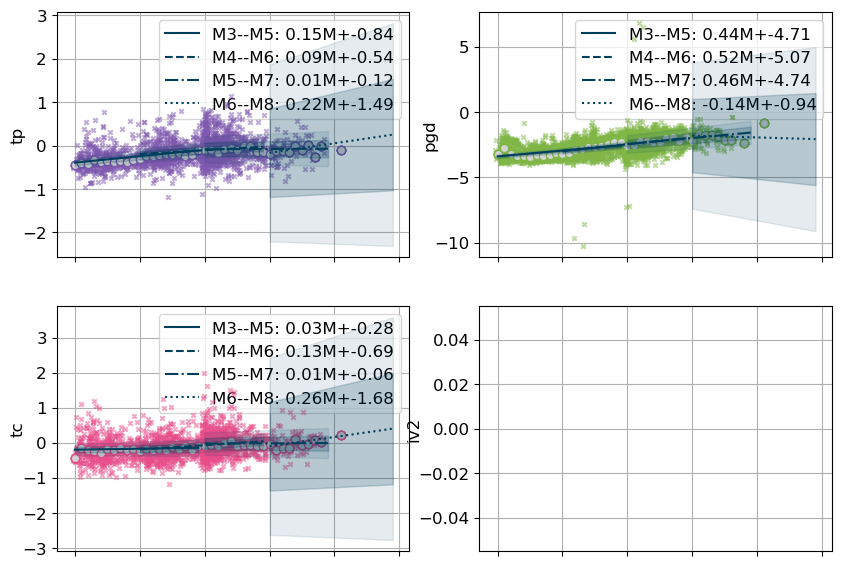

In [26]:
%matplotlib inline
min_dist = 0
max_dist = 200
n_stations = 0
for f in filenames:
    for min_dist in range(0, 200, 10):
        print(f)
        df = pd.read_pickle(f'/home/earthquakes1/homes/Rebecca/phd/data/results_database/{f}')
        #n_stations = 0
        x_tp, y_tp = calc_tp_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_pgd, y_pgd = calc_pgd_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_tc, y_tc = calc_tc_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_iv2, y_iv2 = calc_iv2_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)


        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_tp_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        tp_params = [gradt, gradt_std, intercept, intercept_std,  'tp']
        tp_pearson = pearson
        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_pgd_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'pgd', True)  
        pgd_pearson = pearson
        pgd_params = [gradt, gradt_std, intercept, intercept_std,  'pgd']

        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_tc_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'pgd', True)  
        tc_params = [gradt, gradt_std, intercept, intercept_std, 'tc']
        tc_pearson = pearson
        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_iv2_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            #print(len(x[y==0]))
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        iv2_params = [gradt, gradt_std, intercept, intercept_std, 'iv2']
        iv2_pearson = pearson

        plot_data_subplots_line_m2([x_tp, x_pgd, x_tc, x_iv2], [y_tp, y_pgd, y_tc, y_iv2], ['tp','pgd','tc','iv2'],f, tp_params, pgd_params, tc_params, iv2_params, n = n_stations, min_dist = min_dist, max_dist = max_dist, save = True, show = True)
        #plot_spearman_subplots_all_on_one_no_n_shaded(f, tp_params, pgd_params, iv2_params, tc_params, save = False)
        #print(tp_params[4][0], tc_params[4][0])
        #plot_spearman_subplots_all_on_one_no_n_shaded(f, gradt, gradt_std, spearman, spearman_p, n, 'iv2', True) 
        print(tp_params[0][0],tp_params[0][9])
        print(tc_params[0][0],tc_params[0][9])


## gradt mag lines 

eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


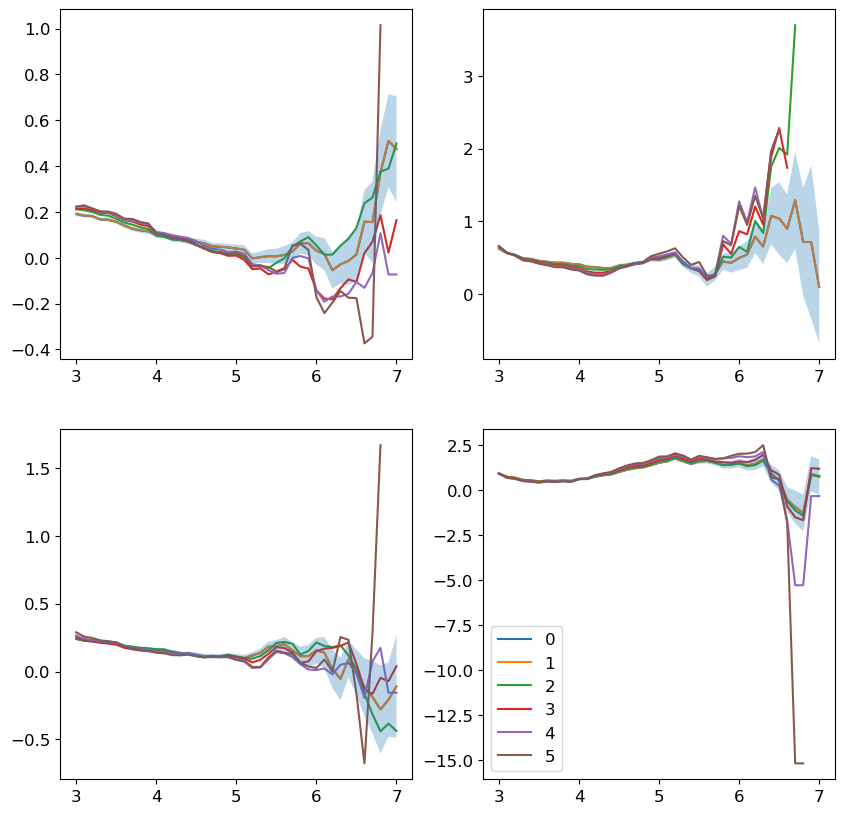

In [7]:
%matplotlib inline
min_dist = 0
max_dist = 200

for f in filenames[0:1]:
    fig, axs = plt.subplots(2,2, figsize = (10,10))
    print(f)
    df = pd.read_pickle(f'/home/earthquakes1/homes/Rebecca/phd/data/results_database/{f}')
    for n_stations in range(0, 6, 1):
        #n_stations = 0
        x_tp, y_tp = calc_tp_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_pgd, y_pgd = calc_pgd_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_tc, y_tc = calc_tc_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_iv2, y_iv2 = calc_iv2_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)


        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_tp_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        tp_params = [gradt, gradt_std, intercept, intercept_std,  'tp']
        tp_pearson = pearson
        
        if n_stations == 0:
            axs[0][0].fill_between(np.arange(3,8,0.1)[0:len(gradt)],np.array(gradt_std)+np.array(gradt),np.array(gradt)-np.array(gradt_std), alpha = 0.3, zorder = 1000)

        axs[0][0].plot(np.arange(3,8,0.1)[0:len(gradt)], gradt, label = n_stations)
        
        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_pgd_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'pgd', True)  
        pgd_pearson = pearson
        pgd_params = [gradt, gradt_std, intercept, intercept_std,  'pgd']

        if n_stations == 0:
            axs[0][1].fill_between(np.arange(3,8,0.1)[0:len(gradt)],np.array(gradt_std)+np.array(gradt),np.array(gradt)-np.array(gradt_std), alpha = 0.3, zorder = 1000)

        axs[0][1].plot(np.arange(3,8,0.1)[0:len(gradt)], gradt, label = n_stations)
        
        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_tc_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'pgd', True)  
        tc_params = [gradt, gradt_std, intercept, intercept_std, 'tc']
        tc_pearson = pearson
        
        if n_stations == 0:
            axs[1][0].fill_between(np.arange(3,8,0.1)[0:len(gradt)],np.array(gradt_std)+np.array(gradt),np.array(gradt)-np.array(gradt_std), alpha = 0.3, zorder = 1000)
     
        axs[1][0].plot(np.arange(3,8,0.1)[0:len(gradt)], gradt, label = n_stations)
        
        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_iv2_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            #print(len(x[y==0]))
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        iv2_params = [gradt, gradt_std, intercept, intercept_std, 'iv2']
        iv2_pearson = pearson
        
        if n_stations == 0:
            axs[1][1].fill_between(np.arange(3,8,0.1)[0:len(gradt)],np.array(gradt_std)+np.array(gradt),np.array(gradt)-np.array(gradt_std), alpha = 0.3, zorder = 1000)

        axs[1][1].plot(np.arange(3,8,0.1)[0:len(gradt)], gradt, label = n_stations)

    plt.legend()
    plt.show()


eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


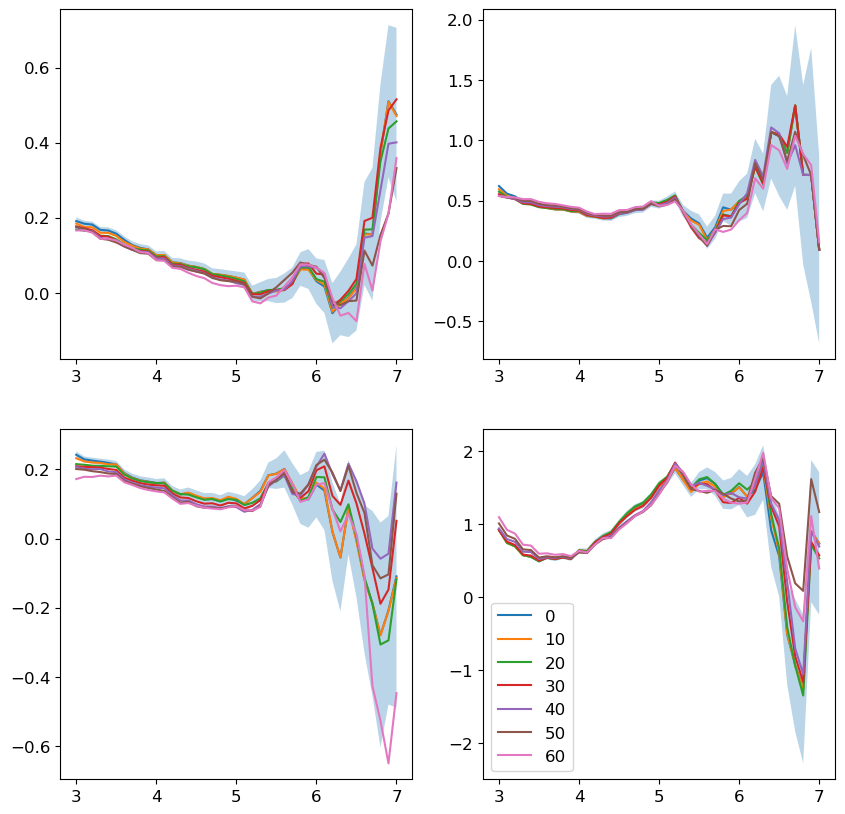

In [6]:
%matplotlib inline
min_dist = 0
max_dist = 200
n_stations = 0
for f in filenames[0:1]:
    print(f)
    fig, axs = plt.subplots(2,2, figsize = (10,10))
    df = pd.read_pickle(f'/home/earthquakes1/homes/Rebecca/phd/data/results_database/{f}')
    for min_dist in range(0, 70, 10):
        #n_stations = 0
        x_tp, y_tp = calc_tp_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_pgd, y_pgd = calc_pgd_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_tc, y_tc = calc_tc_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)
        x_iv2, y_iv2 = calc_iv2_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)


        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_tp_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        tp_params = [gradt, gradt_std, intercept, intercept_std,  'tp']
        tp_pearson = pearson
        if min_dist == 0:
            axs[0][0].fill_between(np.arange(3,8,0.1)[0:len(gradt)],np.array(gradt_std)+np.array(gradt),np.array(gradt)-np.array(gradt_std), alpha = 0.3)
        axs[0][0].plot(np.arange(3,8,0.1)[0:len(gradt)], gradt, label = min_dist)

        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_pgd_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'pgd', True)  
        pgd_pearson = pearson
        pgd_params = [gradt, gradt_std, intercept, intercept_std,  'pgd']
        if min_dist == 0:
            axs[0][1].fill_between(np.arange(3,8,0.1)[0:len(gradt)],np.array(gradt_std)+np.array(gradt),np.array(gradt)-np.array(gradt_std), alpha = 0.3)
        axs[0][1].plot(np.arange(3,8,0.1)[0:len(gradt)], gradt, label = min_dist)

        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_tc_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'pgd', True)  
        tc_params = [gradt, gradt_std, intercept, intercept_std, 'tc']
        tc_pearson = pearson
        if min_dist == 0:
            axs[1][0].fill_between(np.arange(3,8,0.1)[0:len(gradt)],np.array(gradt_std)+np.array(gradt),np.array(gradt)-np.array(gradt_std), alpha = 0.3)
        axs[1][0].plot(np.arange(3,8,0.1)[0:len(gradt)], gradt, label = min_dist)

        gradt, intercept, gradt_std, intercept_std = [],[],[],[]
        pearson = []
        spearman = []
        spearman_p = []
        n_l = []

        for mag_lim in magnitudes:
            x, y = calc_iv2_mag_lim(df, (mag_lim,mag_lim+2),n=n_stations, min_dist = min_dist, max_dist = max_dist)
            #print(len(x[y==0]))
            gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
        iv2_params = [gradt, gradt_std, intercept, intercept_std, 'iv2']
        iv2_pearson = pearson
        if min_dist == 0:
            axs[1][1].fill_between(np.arange(3,8,0.1)[0:len(gradt)],np.array(gradt_std)+np.array(gradt),np.array(gradt)-np.array(gradt_std), alpha = 0.3)
        axs[1][1].plot(np.arange(3,8,0.1)[0:len(gradt)], gradt, label = min_dist)
    plt.legend()
    plt.show()
    


In [16]:
%matplotlib inline
n_stations = 0
min_dist = 30
max_dist = 200
min_dist_list = []
n_stations_list = []
sign_list_tp = []
sign_list_pgd = []
sign_list_tc = []
sign_list_iv2 = []
for f in filenames[0:1]:
    print(f)
    df = pd.read_pickle(f'/home/earthquakes1/homes/Rebecca/phd/data/results_database/{f}')
    #print(df.head(10))
    for n_stations in range(0,7):
        for min_dist in range(0, 100, 20):
            options = {'n': n_stations, 'min_dist': min_dist, 'max_dist': max_dist}
            x_tp, y_tp = calc_tp_mag_lim(df, 3.,**options)
            x_pgd, y_pgd = calc_pgd_mag_lim(df, 3.,**options)
            x_tc, y_tc = calc_tc_mag_lim(df, 3.,**options)
            x_iv2, y_iv2 = calc_iv2_mag_lim(df, 3.,**options)

            n_stations_list.append(n_stations)
            min_dist_list.append(min_dist)
            
            gradt, intercept, gradt_std, intercept_std = [],[],[],[]
            pearson = []
            spearman = []
            spearman_p = []
            n_l = []
            
            for mag_lim in magnitudes:
                x, y = calc_tp_mag_lim(df, mag_lim,**options)
                gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
            tp_params = [gradt, gradt_std, np.array(pearson)**2, spearman, spearman_p, n, 'tp']
            #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'tp', False)  
            if len(spearman)>0:
                print('tp', spearman[0])

            res = [idx for idx, val in enumerate(tp_params[4]) if val > 0.05]
            if len(res)>0:
                sign_list_tp.append(res[0])
            else:
                sign_list_tp.append(0)

            gradt, intercept, gradt_std, intercept_std = [],[],[],[]
            pearson = []
            spearman = []
            spearman_p = []
            n_l = []
            
            for mag_lim in magnitudes:
                x, y = calc_pgd_mag_lim(df, mag_lim,**options)
                gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
            #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'pgd', False)  
            pgd_params = [gradt, gradt_std, np.array(pearson)**2, spearman, spearman_p, n,  'pgd']
            if len(spearman)>0:
                print('pgd', spearman[0])

            res = [idx for idx, val in enumerate(pgd_params[4]) if val > 0.05]
            if len(res)>0:
                sign_list_pgd.append(res[0])
            else:
                sign_list_pgd.append(0)

            gradt, intercept, gradt_std, intercept_std = [],[],[],[]
            pearson = []
            spearman = []
            spearman_p = []
            n_l = []
            
            for mag_lim in magnitudes:
                x, y = calc_tc_mag_lim(df, mag_lim,**options)
                gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
            #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'pgd', False)  
            tc_params = [gradt, gradt_std, np.array(pearson)**2, spearman, spearman_p, n, 'tc']
            if len(spearman)>0:
                print('tc', spearman[0])

            res = [idx for idx, val in enumerate(tc_params[4]) if val > 0.05]
            if len(res)>0:
                sign_list_tc.append(res[0])
            else:
                sign_list_tc.append(0)

            gradt, intercept, gradt_std, intercept_std = [],[],[],[]
            pearson = []
            spearman = []
            spearman_p = []
            n_l = []
            
            for mag_lim in magnitudes:
                x, y = calc_iv2_mag_lim(df, mag_lim,**options)
                #print(len(x[y==0]))
                gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
            #plot_spearman_subplots(f, gradt, gradt_std, spearman, spearman_p, n, 'iv2', False)  
            iv2_params = [gradt, gradt_std, np.array(pearson)**2, spearman, spearman_p, n,'iv2']
            if len(spearman)>0:
                print('iv2', spearman[0])

            res = [idx for idx, val in enumerate(iv2_params[4]) if val > 0.05]
            if len(res)>0:
                sign_list_iv2.append(res[0])
            else:
                sign_list_iv2.append(0)

            #plot_data_subplots_line([x_tp, x_pgd, x_tc, x_iv2], [y_tp, y_pgd, y_tc, y_iv2], ['tp','pgd','tc','iv2'],f, tp_params, pgd_params, tc_params, iv2_params)
            #plot_spearman_subplots_all_on_one_no_n_shaded_percent_var(f, tp_params, pgd_params, iv2_params, tc_params, log = False, save = True, **options)
            #print(tp_params[4][0], tc_params[4][0])
            #plot_spearman_subplots_all_on_one(f, gradt, gradt_std, spearman, spearman_p, n, 'iv2', True) 
            



eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20
tp 0.4799405062338639
pgd 0.6089165968103959
tc 0.5563437231853089
iv2 0.44732639520425554
tp 0.45437271895046377
pgd 0.591319471998318
tc 0.5317765614609813
iv2 0.4409473375684877
tp 0.433355678022483
pgd 0.568657457388001
tc 0.48004608028870693
iv2 0.419616106570247
tp 0.40791354898234583
pgd 0.5774666881508789
tc 0.41998047938195265
iv2 0.45229635018573716
tp 0.3834624880681195
pgd 0.5855264448848957
tc 0.3165081826287607
iv2 0.5069781428944471
tp 0.4799405062338639
pgd 0.6089165968103959
tc 0.5563437231853089
iv2 0.44732639520425554
tp 0.45437271895046377
pgd 0.591319471998318
tc 0.5317765614609813
iv2 0.4409473375684877
tp 0.433355678022483
pgd 0.568657457388001
tc 0.48004608028870693
iv2 0.419616106570247
tp 0.40791354898234583
pgd 0.5774666881508789
tc 0.41998047938195265
iv2 0.45229635018573716
tp 0.3834624880681195
pgd 0.5855264448848957
tc 0.3165081826287607
iv2 0.5069781428944471
tp 0.5819657244264809
pgd 0.60983366274477

Text(0, 0.5, 'Significance')

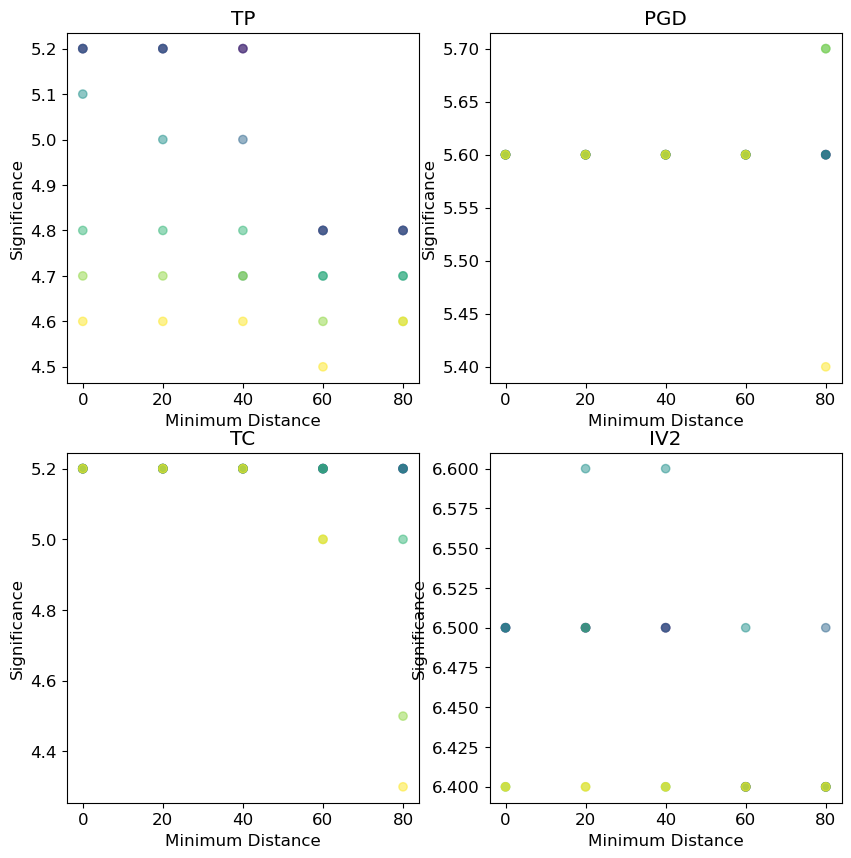

In [19]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))

axs[0][0].scatter(min_dist_list, (np.array(sign_list_tp) + 30) / 10, c = n_stations_list, cmap = 'viridis', alpha = 0.5)
axs[1][0].scatter(min_dist_list, (np.array(sign_list_tc) + 30) / 10, c = n_stations_list, cmap = 'viridis', alpha = 0.5)
axs[0][1].scatter(min_dist_list, (np.array(sign_list_pgd) + 30) / 10, c = n_stations_list, cmap = 'viridis', alpha = 0.5)
axs[1][1].scatter(min_dist_list, (np.array(sign_list_iv2) + 30) / 10, c = n_stations_list, cmap = 'viridis', alpha = 0.5)

axs[0][0].set_title('TP')
axs[1][0].set_title('TC')
axs[0][1].set_title('PGD')
axs[1][1].set_title('IV2')

axs[0][0].set_xlabel('Minimum Distance')
axs[1][0].set_xlabel('Minimum Distance')
axs[0][1].set_xlabel('Minimum Distance')
axs[1][1].set_xlabel('Minimum Distance')

axs[0][0].set_ylabel('Significance')
axs[1][0].set_ylabel('Significance')
axs[0][1].set_ylabel('Significance')
axs[1][1].set_ylabel('Significance')


## debug

In [6]:
def sort_tp_data(df, mag_lim=0, n=0, min_dist=0, max_dist=1000):
    list_mag = []
    list_tpmax = []
    count = 0
    # print(mag_lim, type(mag_lim))
    if type(mag_lim) in [int, float, np.float64]:
        min_mag_lim = mag_lim
        max_mag_lim = 10
    else:
        (min_mag_lim, max_mag_lim) = mag_lim
    for index, row in df.iterrows():
        if (row.eq_mag > min_mag_lim and
                row.eq_mag < max_mag_lim and
                len(row.tp_max) >= n):
            list_mag.append(row.eq_mag)
            list_tpmax.append([])
            for d in range(0, len(row.tp_max)):
                if (row.tp_max[d] is not None
                        and row.tp_max[d] > 0
                        and row.distance_dict[row.tp_max_stations[d]] > min_dist
                        and row.distance_dict[row.tp_max_stations[d]] < max_dist):
                    list_tpmax[count].append(row.tp_max[d])
            count += 1
    return list_mag, list_tpmax

def calc_tp_mag_lim(df, mag_lim, n=0, min_dist=0, max_dist=1000):
    # print(mag_lim)
    list_mags, list_tpmax = sort_tp_data(
        df, mag_lim, n=n, min_dist=min_dist, max_dist=max_dist)
    y_aves_tp = []
    x_aves_tp = []
    i = 0
    for i in range(0, len(list_mags)):
        if len(list_tpmax[i]) >= 1:
            mean_tp = np.mean(list_tpmax[i])
            std_tp = np.std(list_tpmax[i])
            y_tp = []
            for j in list_tpmax[i]:
                if (j > mean_tp - 2 * std_tp
                        and j < mean_tp + 2 * std_tp):  # and j < 100:
                    y_tp.append(math.log(j, 10))
                elif len(list_tpmax[i]) == 1:
                    y_tp.append(math.log(j, 10))
            x_tp = np.zeros(len(y_tp))
            x_tp = x_tp + list_mags[i]
            if math.isnan(np.median(y_tp)) is False:
                y_aves_tp.append(np.median(y_tp))
                x_aves_tp.append(list_mags[i])
    return x_aves_tp, y_aves_tp

def calc_opt(x, y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l):
    if len(y) > 0:
        x_use = np.array(x) - 5
        y_use = np.array(y)

        x = x_use
        y = y_use
        # x_unique = np.arange(min(x_use), max(x_use), 0.1)

        if len(set(x)) > 1:
            result = scipy.stats.linregress(x, y)
            a = result.slope
            gradt.append(a)
            b = result.intercept
            intercept.append(b)
            std_a = result.stderr
            gradt_std.append(std_a)
            std_b = result.intercept_stderr
            intercept_std.append(std_b)
            # plt.scatter(x,y)
            # x_plot = np.array([-2,3])
            # plt.plot(x_plot,a*x_plot+b)
            pearson.append(result.rvalue)
            spearman.append(scipy.stats.spearmanr(x, y)[0])
            spearman_p.append(scipy.stats.spearmanr(x, y)[1])
            n_l.append(len(x))
    return gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l

eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr20


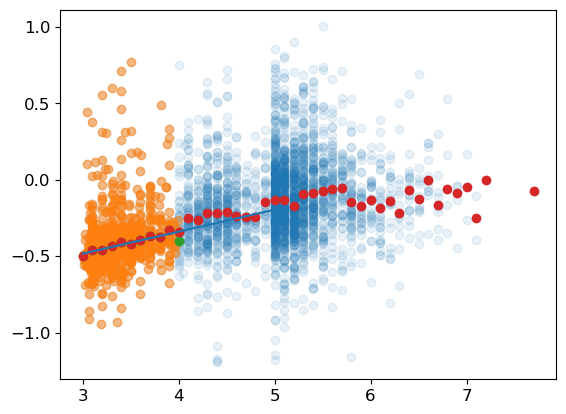

In [24]:
n_stations = 0
min_dist = 0
max_dist = 200
f = filenames[0]
min_dist = 70
print(f)
df = pd.read_pickle(f'/home/earthquakes1/homes/Rebecca/phd/data/results_database/{f}')

x_tp, y_tp = calc_tp_mag_lim(df, 3.,n=n_stations, min_dist = min_dist, max_dist = max_dist)

gradt, intercept, gradt_std, intercept_std = [],[],[],[]
pearson = []
spearman = []
spearman_p = []
n_l = []

mag_lim = 3 # for mag_lim in magnitudes:
x, y = calc_tp_mag_lim(df, (mag_lim,mag_lim+1),n=n_stations, min_dist = min_dist, max_dist = max_dist)
gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n = calc_opt(x,y, gradt, intercept, gradt_std, intercept_std, pearson, spearman, spearman_p, n_l)
tp_params = [gradt, gradt_std, intercept, intercept_std,  'tp']
tp_pearson = pearson

#plot_data_subplots_line_m2([x_tp, x_pgd, x_tc, x_iv2], [y_tp, y_pgd, y_tc, y_iv2], ['tp','pgd','tc','iv2'],f, tp_params, pgd_params, tc_params, iv2_params, n = n_stations, min_dist = min_dist, max_dist = max_dist, save = True, show = True)
median, bin_edges, bin_number = scipy.stats.binned_statistic(x, y, statistic='median', bins=np.arange(2.95, 8.05, 0.1), range=None)

plt.scatter(x_tp, y_tp, alpha = 0.1)
plt.scatter(x, y, alpha = 0.5)
plt.plot([3,5], np.log10([3*gradt[0] + intercept[0], 5*gradt[0] + intercept[0]]))
plt.scatter(bin_edges[:-1] + 0.05, median)

#plt.scatter(x_tp, y_tp)
median, bin_edges, bin_number = scipy.stats.binned_statistic(x_tp, y_tp, statistic='median', bins=np.arange(2.95, 8.05, 0.1), range=None)

plt.scatter(bin_edges[:-1] + 0.05, median)

In [16]:
median

array([-0.49951144, -0.46163831, -0.45682046, -0.43120788, -0.40981045,
       -0.41912309, -0.39204704, -0.37109968, -0.37322287, -0.33121389,
       -0.34438533, -0.24786464, -0.26191236, -0.22061656, -0.21729744,
       -0.21313262, -0.23413275, -0.24427816, -0.24660088, -0.1473247 ,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,         nan,         nan])

## other stuff

In [ ]:
from spearman_plotting_func import *
plot_spearman_subplots_all_on_one_no_n_shaded(f, tp_params, pgd_params, iv2_params, tc_params, save = False)

In [ ]:
list_tp_all = list(df.tp_max)

In [ ]:
list_base_folders = ['/home/earthquakes1/homes/Rebecca/phd/data/2005_2018_global_m5/','/home/earthquakes1/homes/Rebecca/phd/data/2018_2021_global_m5/','/home/earthquakes1/homes/Rebecca/phd/data/2019_global_m3/']

filenames = ['eq_object_03s_bandpass_01_19_snr_20_blank_0_new_snr5',
             'eq_object_03s_bandpass_01_19_snr_20_blank_005_new_snr5', 
             'eq_object_03s_bandpass_01_19_snr_20_blank_01_new_snr5',
             'eq_object_05s_bandpass_01_19_snr_20_blank_0_new_snr5',
             'eq_object_05s_bandpass_01_19_snr_20_blank_005_new_snr5', 
             'eq_object_05s_bandpass_01_19_snr_20_blank_01_new_snr5',
             'eq_object_05s_bandpass_01_19_snr_20_blank_025_new_snr5',
             'eq_object_1s_bandpass_01_19_snr_20_blank_0_new_snr5', 
             'eq_object_1s_bandpass_01_19_snr_20_blank_005_new_snr5',
             'eq_object_1s_bandpass_01_19_snr_20_blank_01_new_snr5',
             'eq_object_1s_bandpass_01_19_snr_20_blank_025_new_snr5',
             'eq_object_1s_bandpass_01_19_snr_20_blank_05_new_snr5',
              'eq_object_4s_bandpass_01_19_snr_20_blank_0_new_snr5',
              'eq_object_4s_bandpass_01_19_snr_20_blank_005_new_snr5',
              'eq_object_4s_bandpass_01_19_snr_20_blank_01_new_snr5',
              'eq_object_4s_bandpass_01_19_snr_20_blank_025_new_snr5',
              'eq_object_4s_bandpass_01_19_snr_20_blank_05_new_snr5']

fn = 'eq_object_1s_bandpass_01_19_snr_20_blank_025_new'


for fn in filenames[0:1]:
    print(fn)
    for base_folder in list_base_folders[0:1]:
        print(base_folder)
        folders = os.listdir(base_folder)
        for eq_no in range(0, 1):#len(folders)):
            #start = time.perf_counter()
            #print(base_folder, folders[eq_no], fn)
            if os.path.exists(base_folder+folders[eq_no]+'/'+fn+'.pkl'):
                with open(base_folder+folders[eq_no]+'/'+fn+'.pkl', 'rb') as picklefile:
                    eq = pickle.load(picklefile)

In [ ]:
df

In [ ]:
eq.latitude


In [ ]:
import geopy


def make_distance_dict(eq):
    distances = {}
    inv = eq.inv
    for net in inv:
        for sta in net:
            for loc in sta:
                sta_lat = loc.latitude
                sta_long = loc.longitude
                distance = geopy.distance.distance((eq.event_stats['eq_lat'],eq.event_stats['eq_long']), (sta_lat,sta_long))
                distances[f"{net.code}.{sta.code}.{loc.location_code}"] = distance
    return distances
